# **<span style="color: #87CEEB;">Optimizers and Autoencoders Experiments</span>**



<h1><b> Part 1: Optimization Methods: Line Search Experiments</b></h1>

## Objective
- **Learn and Compare Line Search Methods:** Implement and compare different step-size strategies for gradient descent, including constant step size, exact line search, and inexact (backtracking) line search with the Armijo condition.  
- **Develop Practical Optimization Skills:** Practice minimizing simple quadratic functions to build intuition about convergence behaviors.  
- **Visualize and Analyze Results:** Generate informative plots and tables that summarize gradient norms, function values, and iterative progress over contour lines.  
- **Bridge to Deep Learning:** Use these foundational optimization techniques as a stepping stone for more advanced methods such as Adam and Adadelta

## Project Overview
1. **Implement Gradient Descent:**  
   - Set up your functions to compute gradients and update parameters.
   - Use a simple bivariate quadratic function as a test bed.

2. **Experiment with Line Search Methods:**  
   - Constant Step Size  
   - Exact Line Search  
   - Backtracking Line Search **(Armijo condition, do not get scared by this term its just a fancy term to a very intuitive condition)**  

3. **Gather and Present Data:**  
   - Record key metrics (e.g., gradient norms, function values).
   - Plot iterates on the contour of the function.

4. **Analyze and Interpret:**  
   - Compare the methods based on convergence speed and stability.
   - Discuss the implications of each strategy for more complex scenarios like deep learning.

## Experiments

## Implementation Notes
- **No Use of Artificial Intelligence for Direct Code Generation:** You must write your own code. Do not use AI-based code generators (e.g., Copilot, ChatGPT, etc.) to complete this assignment.
- **Allowed Libraries:** You will be given zero marks if you use any other libraries other than these.
  ```python
  import numpy as np
  import matplotlib.pyplot as plt
  import pandas as pd


In [2]:
# Import libraries here
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

## Task 1: Implementing the Gradient Descent with Line Search

Imagine you're trying to find the lowest point in a valley (the minimum of a function). You take steps downhill, but how big should each step be? This function will help you decide that.

### Task Description
You will create a function called `line_search` that determines the step size \($\alpha$) for gradient descent. This function should handle three scenarios based on a parameter called `ls_type`:
1. **Constant Step Size** (`ls_type = 0`): Always use the same step size provided in `params`.
2. **Exact Line Search** (`ls_type = 1`): Iteratively shrink the step size until a decrease in the function value is observed.
3. **Backtracking Line Search** (`ls_type = 2`): Iteratively reduce the step size according to the **Armijo condition**:

$$
f(\mathbf{x} + \alpha \mathbf{d}) \leq f(\mathbf{x}) + c \, \alpha \, \nabla f(\mathbf{x})^T \mathbf{d}
$$

where $(0 < c < 1)$.

### Step by Step guide

1. Constant Step Size (`ls_type = 0`)
  - What it does?
    - You take the same-sized step every time, no thinking. Like walking downhill with fixed strides. If your TA, Shaheer Ahmad says "always take $10$ cm steps," you do it blindly.
  - Objective:
    - Use a fixed step size ($\alpha_{st}$) provided in params. You do not need to update $α$.

2. Exact Line Search (`ls_type = 1`)
  - What it does:
    - You try to find the "best" step size that makes the function value smaller. You rebel against Shaheer Ahmad and start testing step sizes until you find one that actually lowers your position in the valley.
  - Objective:
    - Find a step size $\alpha$ such that $f(x_{new}) < f(x)$ by iteratively reducing $\alpha$ if no decrease is observed. You are checking if the value of $f$ decreases at $x_{new}$. If there is no decrease, you perform a `shrink_step`, in which you reduce $\alpha_{st}$ by a factor $\rho$ (i.e., $\alpha_{st} *= \rho$).

  3. Backtracking Line Search (`ls_type = 2`)

      - What It Does
        - **Idea:** Start with a relatively large step size. If that step doesn’t decrease the function value enough, “backtrack” by shrinking the step size and try again.
        - **Why?** This ensures you take a step that is not too big, avoiding overshooting the optimum while still making good progress.

      - Objective:
        - **Goal:** Find a step size $\alpha$ such that the function value decreases sufficiently.
        - This is achieved by enforcing a condition (known as **Armijo's condition**) that guarantees a minimum acceptable reduction in the function value after taking the step. So if the Armijo's condition is satisfied you return $α$, if not you perform the `shrink_step` (reduce $\alpha_{st}$ by $\rho$).

      - Armijo's Condition Explained
        - **The Formula:**
          $$
          f(\mathbf{x} + \alpha \mathbf{d}) \leq f(\mathbf{x}) + c \alpha \nabla f(\mathbf{x})^T \mathbf{d}
          $$
        - **Breaking It Down:**
          - **$f(\mathbf{x} + \alpha \mathbf{d})$:**  
            - The function value at the new point after taking a step of size $\alpha$ in direction $\mathbf{d}$.
          - **$f(\mathbf{x})$:**  
              - The current function value.
          - **$\alpha$:**  
              - The step size you are testing.
          - **$c$:**  
              - A small positive constant (typically between 0 and 1) that sets the minimum fraction of the expected decrease.
          - **$\nabla f(\mathbf{x})^T \mathbf{d}$:**  
              - The directional derivative of $f$ at $\mathbf{x}$ in the direction $\mathbf{d}$.  
              - *Note*: In gradient descent, $\mathbf{d} = -\nabla f(\mathbf{x})$, making this term negative and indicating a decrease in $f$. You do not need to worry too much about this.
          
      - Intuitive Explanation:
        - The right-hand side, $f(\mathbf{x}) + c \alpha \nabla f(\mathbf{x})^T \mathbf{d}$, represents a "minimum acceptable" value that $f$ should reach after the step.
        - In simple terms: After taking a step of size $\alpha$, your function’s value should drop by at least a small fraction (determined by $c$) of the amount predicted by the slope (given by the gradient). If it doesn’t, the step size is probably too large.
        - In Analogy Terms: Take a step, but also check if the drop matches how steep the hill is. If the hill is steep, demand a bigger drop!


In [3]:
def line_search(fun, d, x, params):
    """
    Perform line search to determine the step size (alpha).

    Args:
        fun (callable): The objective function to be minimized.
        d (numpy.ndarray): The search direction.
        x (numpy.ndarray): Current iterate.
        params (dict): A dictionary containing all necessary parameters for line search.
            Required keys:
                - 'alpha_st': Initial step length (float).
                - 'rho': Shrinkage factor (0 < rho < 1).
                - 'c': Armijo condition factor (0 < c < 1).
                - 'maxit': Maximum number of line search iterations (int).
                - 'ls_type': Type of line search (0 for constant, 1 for exact, 2 for backtracking).
                - 'grad_fun': Function to compute the gradient (callable).

    Returns:
        alpha_ls (float): Chosen step size.
        x_new (numpy.ndarray): Updated parameter vector $x + \alpha_{ls} \, d$.
    """

    # Write Code here: (The input and output must follow the above format)

    alpha_st = params['alpha_st']
    rho = params['rho']
    c = params['c']
    maxit = params['maxit']
    ls_type = params['ls_type']
    grad_fun = params['grad_fun']

    alpha_ls = 0

    if ls_type == 0:
        alpha_ls = alpha_st
    elif ls_type == 1:
        alpha_ls = alpha_st
        for i in range(maxit):
            if fun(x + alpha_ls * d) < fun(x):
                break
            alpha_ls *= rho
    elif ls_type == 2:
        alpha_ls = alpha_st
        for i in range(maxit):
            if fun(x + alpha_ls * d) <= fun(x) + c * alpha_ls * np.dot(grad_fun(x).T, d):
                break
            alpha_ls *= rho

    x_new = x + alpha_ls * d
    return alpha_ls, x_new


<>:2: SyntaxWarning: invalid escape sequence '\,'
<>:2: SyntaxWarning: invalid escape sequence '\,'
/var/folders/_6/bw8292wd4kn8b2f_d6prhw3c0000gn/T/ipykernel_48529/3155840262.py:2: SyntaxWarning: invalid escape sequence '\,'
  """


Now lets get started on implementing a function called `grad_descent` that uses the gradient descent algorithm to minimize a given function. Gradient descent is an iterative method that moves step-by-step in the direction of steepest descent (i.e., the negative gradient) until it finds a minimum.

### What is Gradient Descent?
Imagine you’re standing on a hill and want to reach the lowest valley. At your current position, you determine the steepest downward direction by calculating the gradient of the function. Then, you take a step in that direction. Repeating this process will eventually bring you near the valley’s bottom.

### Key Concepts
- **Gradient ($\nabla f(x)$):**  
  - Indicates the direction of steepest ascent. In gradient descent, we use the negative gradient, $-\nabla f(x)$, to move downhill.
- **Step Size ($\alpha$) or Learning Rate:**  
    - The magnitude of the step taken in the descent direction. This value can be fixed or determined via a line search you implemented above.
- **Stopping Criteria:**  
  - The algorithm stops when either:
    - The norm of the gradient, $\|\nabla f(x)\|$, falls below a tolerance threshold ($tol$), or
    - A maximum number of iterations ($maxit$) is reached.


In [4]:
def grad_descent(fun, x, params_gd, iter=None, norms=None, f_values=None):
    """
    Perform gradient descent to minimize the function 'fun'.

    Args:
        fun (callable): The objective function to minimize.
        x (numpy.ndarray): Initial starting point.
        params_gd (dict): A dictionary containing parameters for gradient descent.
            Required keys:
                - 'tol': Tolerance for the gradient norm (e.g., 1e-5).
                - 'maxit': Maximum number of iterations.
                - 'ls_params': A dictionary of parameters for the line search function.
                - 'grad_fun': Function to compute the gradient.

    Returns:
        x (numpy.ndarray): Final solution after descent.
        iter_count (int): Number of iterations performed.
        fun(x) (float): Function value at the final solution.
        grad (numpy.ndarray): Gradient at the final solution.
        norm_grad (float): Norm of the gradient at the final solution.
        iter (list): List of iterations.
        norms (list): List of gradient norms.
        f_values (list): List of function values.
        xs (list): List of x-coordinates of iterates.
        ys (list): List of y-coordinates of iterates.
      """

    # 5 lists to keep track of values
    iter = []
    norms = []
    f_values = []
    xs = []
    ys = []

    # Write Code here (The input and output must follow the above format)
    tol = params_gd['tol']
    maxit = params_gd['maxit']
    ls_params = params_gd['ls_params']
    grad_fun = params_gd['grad_fun']

    for i in range(maxit):
        grad = grad_fun(x)  
        norm_grad = np.linalg.norm(grad)  

        iter.append(i)
        norms.append(norm_grad)
        f_values.append(fun(x))
        xs.append(x[0])
        ys.append(x[1])

        if norm_grad < tol:
            break

        d = -grad/norm_grad
        alpha, x = line_search(fun, d, x, ls_params)

    grad = grad_fun(x)  
    norm_grad = np.linalg.norm(grad)
    iter_count = len(iter)  

    return x, iter_count, fun(x), grad, norm_grad, iter, norms, f_values, xs, ys



# Task 2: Adam Optimizer

Now we will implement a very popular methods called **Adam**.

This method adjust the learning rate based on past gradient information, but they do it in different ways. Let’s break down how this works.

**Key Ideas:**

- **Momentum ($m$):**  
  Adam maintains an exponentially decaying average of past gradients. This “momentum” helps smooth out noisy updates, much like following the general downhill direction.

- **Squared Gradients ($v$):**  
  Adam also keeps track of an exponentially decaying average of past squared gradients. This allows it to adapt the learning rate for each parameter individually.

- **Bias Correction:**  
  Since both $m$ and $v$ are initialized to zero, they start off biased toward zero. To compensate, Adam computes bias-corrected estimates:
  $$
  \hat{m} = \frac{m}{1-\beta_1^t}, \quad \hat{v} = \frac{v}{1-\beta_2^t}
  $$

- **Update Rule:**  
  The parameter update is:
  $$
  x_{\text{new}} = x - \text{lr} \times \frac{\hat{m}}{\sqrt{\hat{v}} + \epsilon}
  $$
  where:
  - **lr** is the learning rate,
  - $\epsilon$ is a small constant to avoid division by zero.

**How to implement this?**

- **Initialize**:
  - The momentum vector $m$ and the squared gradient vector $v$ as zeros (same shape as $x$.

- **For each iteration**:
  1. Compute the gradient $g = \nabla f(x)$.
  2. Update the momentum:
     $$
     m \leftarrow \beta_1 \times m + (1-\beta_1) \times g
     $$
  3. Update the squared gradient:
     $$
     v \leftarrow \beta_2 \times v + (1-\beta_2) \times g^2
     $$
  4. Compute the bias-corrected estimates:
     $$
     \hat{m} = \frac{m}{1-\beta_1^t}, \quad \hat{v} = \frac{v}{1-\beta_2^t}
     $$
  5. Update \(x\):
     $$
     x_{\text{new}} = x - \text{lr} \times \frac{\hat{m}}{\sqrt{\hat{v}} + \epsilon}
     $$
  6. Store $x_{\text{new}}$ for visualization.
  7. **Stop** if the change in $x$, measured by $\|x_{\text{new}} - x\|$ is smaller than a given tolerance, or if you reach the maximum number of iterations.

### Hyperparameters and Practical Considerations
- **Learning rate (`lr`)**: A common default is 0.1 (but this may need tuning).
- $\beta_1$: Typically set to 0.9.
- $\beta_2$: Typically set to 0.999.
- $\epsilon$: A small constant like $1 \times 10^{-8}$.


In [5]:
def adam_optimizer(f, grad_f, x0,
                   lr=0.1, beta1=0.9, beta2=0.999, epsilon=1e-8,
                   tol=1e-5, maxit=100):
    
    """
    Implements the Adam optimization algorithm for minimizing a function.

    Args:
        f (callable): The function to minimize. Takes a numpy array as input and returns a scalar.
        grad_f (callable): The gradient of the function. Takes a numpy array as input and returns a numpy array of the same shape.
        x0 (array-like): Initial starting point as a 1D numpy array.
        lr (float, optional): Learning rate. Default is 0.1.
        beta1 (float, optional): Exponential decay rate for the first moment estimate. Default is 0.9.
        beta2 (float, optional): Exponential decay rate for the second moment estimate. Default is 0.999.
        epsilon (float, optional): Small constant to prevent division by zero. Default is 1e-8.
        tol (float, optional): Tolerance for stopping criterion based on parameter change. Default is 1e-5.
        maxit (int, optional): Maximum number of iterations. Default is 100.

    Returns:
        tuple: (final_x, final_f, final_grad_norm, iter_count, path)
            - final_x (numpy.ndarray): The optimized variable values.
            - final_f (float): The final function value at `final_x`.
            - final_grad_norm (float): The norm of the gradient at `final_x`.
            - iter_count (int): The number of iterations performed.
            - path (list): A list of iterates (numpy arrays) showing the optimization trajectory.
    """

    # Write Code here, please keep the inputs and outputs same
    x = x0.astype(float)  
    m = np.zeros_like(x)  
    v = np.zeros_like(x)  
    path = [x.copy()]  

    iter_count = 0

    converged = False

    while iter_count < maxit and not converged:
        iter_count += 1
        grad = grad_f(x)  

        m = beta1 * m + (1 - beta1) * grad

        v = beta2 * v + (1 - beta2) * (grad ** 2)

        m_hat = m / (1 - beta1**iter_count)
        v_hat = v / (1 - beta2**iter_count)

        x_new = x - (lr * m_hat) / (np.sqrt(v_hat) + epsilon)
        path.append(x_new.copy())  

        if np.linalg.norm(x_new - x) < tol:
            converged = True  

        x = x_new  

    return x, f(x), np.linalg.norm(grad_f(x)), iter_count, path



## Task 3: Adadelta Optimizer

**Key Ideas:**

- **Running Averages:**  
  Instead of a fixed learning rate, Adadelta uses running averages of squared gradients $E[g^2]$ and squared parameter updates $E[\Delta x^2]$

- **Adaptive Step Size:**  
  The update step is given by:
  $$
  \Delta x = - \frac{\text{RMS}(\Delta x)}{\text{RMS}(g)} \times g
  $$
  where:
  - $\text{RMS}(g) = \sqrt{E[g^2] + \epsilon}$
  - $\text{RMS}(\Delta x) = \sqrt{E[\Delta x^2] + \epsilon}$
  
  This approach automatically scales the step size based on how large the gradients have been in the past.

**Your Task:**

- **Initialize**:
  - The starting point $x$.
  - The running averages $E[g^2]$ and $E[\Delta x^2]$ as zeros.

- **For each iteration**:
  1. Compute the gradient $g = \nabla f(x)$.
  2. Update the running average of squared gradients:
     $$
     E[g^2] \leftarrow \rho \times E[g^2] + (1-\rho) \times g^2
     $$
  3. Compute:
     $$
     \text{RMS}(g) = \sqrt{E[g^2] + \epsilon} \quad \text{and} \quad \text{RMS}(\Delta x) = \sqrt{E[\Delta x^2] + \epsilon}
     $$
  4. Calculate the update:
     $$
     \Delta x = - \frac{\text{RMS}(\Delta x)}{\text{RMS}(g)} \times g
     $$
  5. Update \(x\):
     $$
     x_{\text{new}} = x + \Delta x
     $$
  6. Update the running average of squared updates:
     $$
     E[\Delta x^2] \leftarrow \rho \times E[\Delta x^2] + (1-\rho) \times (\Delta x)^2
     $$
  7. Save $x_{\text{new}}$ for visualization.
  8. **Stop** if the change in $x$ is less than the tolerance or if the maximum iterations are reached.

- **For Adadelta:**
  - **\(\rho\)**: Often set to 0.5 or 0.95 (depending on the problem).
  - **\(\epsilon\)**: A small constant, such as $1 \times 10^{-6}$.

- **Initial Point (`x0`):**  
  Choose wisely! The starting point can greatly affect performance, especially in non-convex landscapes.

- **Stopping Criterion:**  
  Both methods stop if the change in $x$ measured by the norm $\|x_{\text{new}} - x\|$ falls below a specified tolerance (`tol`), or if the maximum number of iterations (`maxit`) is reached.


In [6]:
def adadelta_optimizer(f, grad_f, x0, rho=0.5, epsilon=1e-6, tol=1e-5, maxit=100):
    
    x = np.array(x0, dtype=float)
    
    """
    Implements the Adadelta optimization algorithm for minimizing a function.

    Args:
        f (callable): The function to minimize. Takes a numpy array as input and returns a scalar.
        grad_f (callable): The gradient of the function. Takes a numpy array as input and returns a numpy array of the same shape.
        x0 (array-like): Initial starting point as a 1D numpy array.
        rho (float, optional): Decay rate for the running average of past squared gradients. Default is 0.5.
        epsilon (float, optional): Small constant to prevent division by zero. Default is 1e-6.
        tol (float, optional): Tolerance for stopping criterion based on parameter change. Default is 1e-5.
        maxit (int, optional): Maximum number of iterations. Default is 100.

    Returns:
        tuple: (final_x, final_f, final_grad_norm, iter_count, path)
            - final_x (numpy.ndarray): The optimized variable values.
            - final_f (float): The final function value at `final_x`.
            - final_grad_norm (float): The norm of the gradient at `final_x`.
            - iter_count (int): The number of iterations performed.
            - path (list): A list of iterates (numpy arrays) showing the optimization trajectory.
    """
    
    # Write Code here, please keep the inputs and outputs same
    x = np.array(x0, dtype=float)  
    Eg2 = np.zeros_like(x)  
    Edx2 = np.zeros_like(x)  
    path = [x.copy()]  
    iter_count = 0  

    while iter_count < maxit:
        iter_count += 1
        g = grad_f(x)  

        Eg2 = rho * Eg2 + (1 - rho) * (g * g)

        RMS_g = np.sqrt(Eg2 + epsilon)
        RMS_dx = np.sqrt(Edx2 + epsilon)

        dx = - (RMS_dx / RMS_g) * g

        x += dx
        path.append(x.copy())  

        Edx2 = rho * Edx2 + (1 - rho) * (dx * dx)

        if np.linalg.norm(dx) < tol:
            break

    return x, f(x), np.linalg.norm(grad_f(x)), iter_count, path


## Helper *Functions*

In the next code block you will find the following helper functions which will help you inspect the progress of your gradient descent algorithm:

#### 1. `create_table`
This function creates a table of iteration metrics (e.g., gradient norms and function values) for easy inspection.

  - Input:
    - `norms` (list): Stores the norm of the gradient at each iteration.
    - `f_values` (list): Stores the function value at each iteration.
  - Output:
    - A printed table displaying the norm of the gradient and the function value at each step.

#### 2. `plot_f`
This function plots the 3D surface of the function you're minimizing. It helps you visualize the shape of the function's landscape.

  - Input:
    - `fun` (function): The function to be visualized.
  - Output:
    - Figure and Axis.

#### 3. `plot_gd_path_3d`
This function is used to overlay the **gradient descent trajectory** on an existing **3D surface plot**. It helps visualize how the optimization algorithm progresses from the **initial point** towards the **minimum** of the function.

  - Input:
    - `fun` (function): The function to be visualized.
    - xs (list): List of x-coordinates at each iteration.
    - ys (list): List of y-coordinates at each iteration.
    - ax (Axes3D): The 3D axes object to plot on.
  - Output:
    - Plots a 3D trajectory using ax.plot(), marking each step with a small red-bordered black circle.
  - How to use it?
    - Use `plot_f` to generate the 3D surface.
    - Call `plot_gd_path_3d` to add the descent trajectory onto the same figure.

#### 4. `contour_graph`
This function creates a contour plot of the function along with the iterates obtained from your gradient descent algorithm. This is particularly useful for visualizing the optimization path.

  - Input:
    - `norms` (list): Stores the x-coordinates of iterates.
    - `f_values` (list): Stores the y-coordinates of iterates.
    - `limit_axis` (bool): If True, limits the axis to focus on a - zoomed-in region near the minimum. You will need this to check if oscillations are happening near the convergence point
  - Output:
    - A contour plot showing:
      - The function’s level curves (contour lines).
      - The iterates (red dots) representing the path of gradient descent.

In [7]:
from tabulate import tabulate

def create_table(norms, f_values):
    data = {'Norms': norms, 'Function Values': f_values}
    df = pd.DataFrame(data)

    # Select first 10 and last 10 rows
    if len(df) > 20:
        df = pd.concat([df.head(10), df.tail(10)])

    print(tabulate(df, headers='keys', tablefmt='grid', showindex=True))  # 'grid' format adds lines

def plot_f(fun, title):
    x = np.linspace(-10, 10, 100)
    y = np.linspace(-10, 10, 100)
    X, Y = np.meshgrid(x, y)
    Z = fun([X, Y])

    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.7)

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(f'{title}')

    return fig, ax

def plot_gd_path_3d(fun, xs, ys, ax):
    """
    Overlays the path of gradient descent on an existing 3D plot.

    Args:
        fun (callable): The objective function.
        xs (list): List of x-coordinates at each iteration.
        ys (list): List of y-coordinates at each iteration.
        ax (Axes3D): The 3D axes object to plot on.
    """
    # Compute z-values for each (x, y)
    zs = [fun([x_i, y_i]) for (x_i, y_i) in zip(xs, ys)]

    ax.plot(
        xs, ys, zs,
        color='black',
        marker='o',
        markersize=4,
        markeredgecolor='red',
        markeredgewidth=5,
        linewidth=1,
        label='GD Path'
    )
    ax.legend()

def contour_graph(fun,norms, f_values, title, limit_axis = False):
    x = np.linspace(-6.4, 6.4, 200)
    y = np.linspace(-6.4, 6.4, 200)
    X, Y = np.meshgrid(x, y)
    Z = fun([X, Y])

    fig, ax = plt.subplots(figsize=(6, 6))
    contour = ax.contour(X, Y, Z, levels=25, cmap='viridis')

    ax.plot(norms, f_values, marker='o', linestyle='-', color='red', label='Iterates', markersize=8)
    if (limit_axis == True):
        ax.set_xlim(-0.5, 0.5)
        ax.set_ylim(-0.09, 0.09)
    else:
        ax.set_xlim(-6.4, 6.4)
        ax.set_ylim(-6.4, 6.4)

    ax.set_xlabel('x', fontsize=14)
    ax.set_ylabel('y', fontsize=14)
    ax.set_title(f'{title}', fontsize=16)
    ax.legend(fontsize=12)
    ax.grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()

## Task 3 Gradient Descent Problems

### What You Need to Do:

#### Run Gradient Descent (We will get back to ADAM and Adadelta in a bit （＞人＜；）)
1. Run gradient descent three times, once for each `ls_type`.
    - For each problem you will be allowed to change only a few parameters.  
      - For each problem, you may be **allowed** to modify a few parameters, but this will be **explicitly stated** in the problem instructions.
      - For the parameters that cannot be changed, their default values will be mentioned.
    - When running gradient descent **three times** for the three different `ls_type` values (`0`, `1`, and `2`), you **must ensure** the following:
      1. **Keep the Same Gradient Descent Parameters Across Runs**  
        - The parameters **related to gradient descent** (`tol`, `maxit`, etc.) should remain the **same** across all three runs.  
        - The parameters **related to line search** (`alpha_st`, `rho`, `c`, `maxit`) should also remain **consistent** except for `ls_type`, which you will vary.
      2. **Why This Matters**  
        - Keeping all other parameters **constant** ensures that the differences in behavior come **only from the choice of line search method**, making the results **fairly comparable**.
        - If you modify multiple parameters at once, you **cannot accurately attribute** the differences in performance to the line search type alone.

2. Everytime you run gradient descent with different `ls_type` you need to do the following:
    1. Track the following metrics at each iteration:
  - Gradient norm $|\nabla f(x_k)|$ (to measure convergence speed)
  - Function value $ f(x_k) $ (to ensure progress)
    2. Visualize Results:
      1.  Draw two contour plots showing how each method moves towards the minimum. All graphs should be properly labelled, you can pass `title` parameter to `contour_graph`. The labelling scheme should be `problem_id # 0, ls_type = 0`.
        - **Wide view** (shows the overall optimization trajectory)
        - **Zoomed-in view** (focuses on the last iterations to inspect fine details). To do this, you change the `limit_axis` bool in `contour_graph` function to `True`
      2. Draw the descent trajectory on the 3d graph using `plot_gd_path_3d`
    3. You need to create and print a table summarizing key iteration metrics. The table should include:
      - First 10 iterations (to analyze initial progress)
      - Last 10 iterations (to inspect convergence behavior
    4. Show the following values:
        - The final solution ($ x^* $).
        - The final function value ($ f(x^*) $).
        - The norm of the final gradient ($ |\nabla f(x^*)| $).
        - They should be printed in the following format:
        ```python
        print(f"final_x = {final_x}, new_val = {new_val}, last_norm = {last_norm}, iter_count = {iter_count}")
      ```

These are the benchmarks you must beat. 

| Problem | ls_type | Baseline new_value | Baseline iter_count |
|---------|---------|--------------------|---------------------|
| 1       | 0       | 0.181              | 90                  |
| 1       | 1       | 1.65e-12           | 20                  |
| 1       | 2       | 1.06e-11           | 30                  |
| 2       | 0       | 1.0098             | 20                  |
| 2       | 1       | 1.18e-3            | 20                  |
| 2       | 2       | 1.72e-3            | 2                   |
| 3       | 0       | 16.6401            | 100                 |
| 3       | 1       | 7.79e-14           | 25                  |
| 3       | 2       | 1.09e-12           | 35                  |
| 4       | 0       | 10.0686            | 100                 |
| 4       | 1       | ≈ 4.0              | 100                 |
| 4       | 2       | ≈ 3.0              | 100                 |
| 5       | 0       | 296.1788           | 100                 |
| 5       | 1       | 4.9748             | 20                  |
| 5       | 2       | 1.9899             | 35                  |

- **Note**:
  - `≈0` means approximately equal to zero
  - Obviously, iter_count should be less than the above value, your new_val should be lower than the above values, and so on.
  - **We are primarily interested in your new_val and iter_count!**.



#### **Problem 1**
We will work with the following simple quadratic function:

$$
f(x, y) = x^2 + 2y^2
$$

The gradient of this function is:

$$
\nabla f(x, y) =
\begin{bmatrix}
2x \\
4y
\end{bmatrix}
$$

The function is convex and has a unique minimum at $(x, y) = (0, 0)$, meaning all three optimization methods should ideally converge to this point.

We will keep the intital starting point `x_intital` = $\begin{bmatrix}
4 \\
5
\end{bmatrix}$ for this problem. You are **NOT** allowed to change this value

### What Parameters can be changed
Paramters you are **not allowed** to change:
  - `tol` = 1e-5
  - `rho` = 0.5
  - `maxit` (for line search) = 100
  - `maxit` (for gradient descent) = 70
  - You must set the values to these in the `param_ls` and `param_grad` list
  - You can change the rest as you see fit.



ls_type = 0


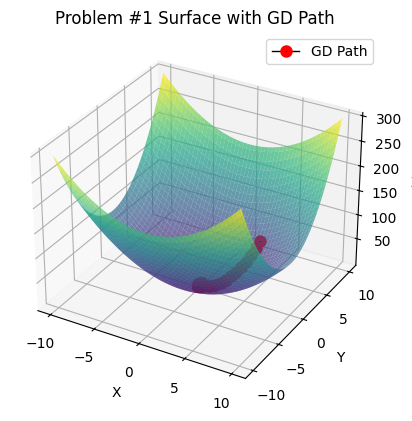

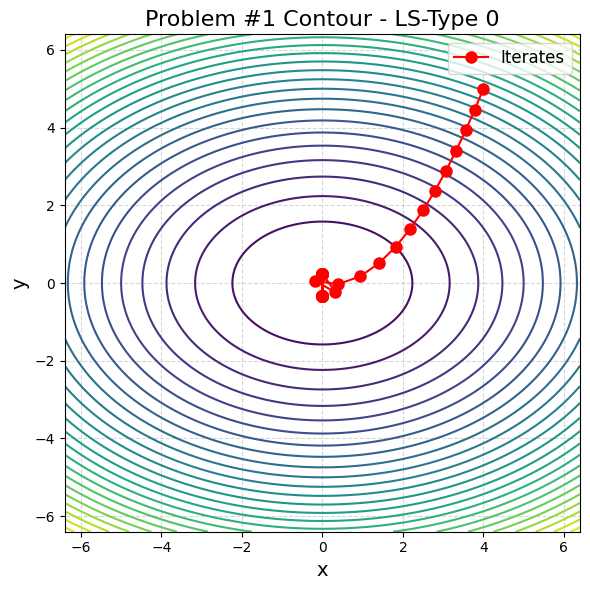

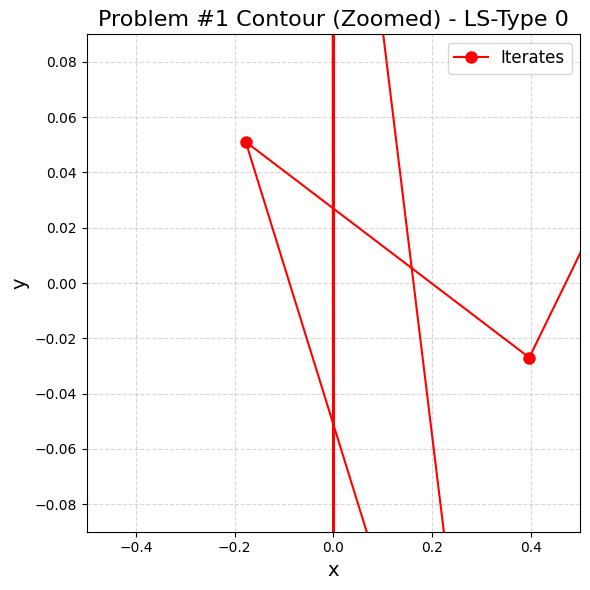

Final Solution: [-2.71375435e-46  2.40850754e-01]
New Value: 0.11601817180971807
Gradient Norm: 0.9634030176814605
Iterations: 70

ls_type = 1


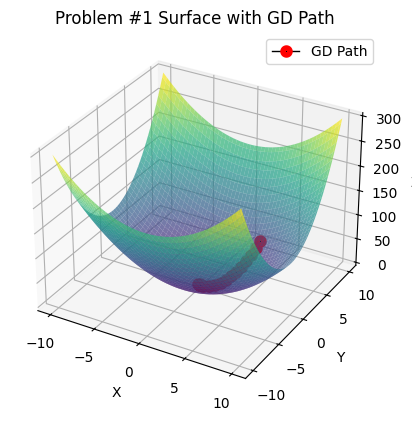

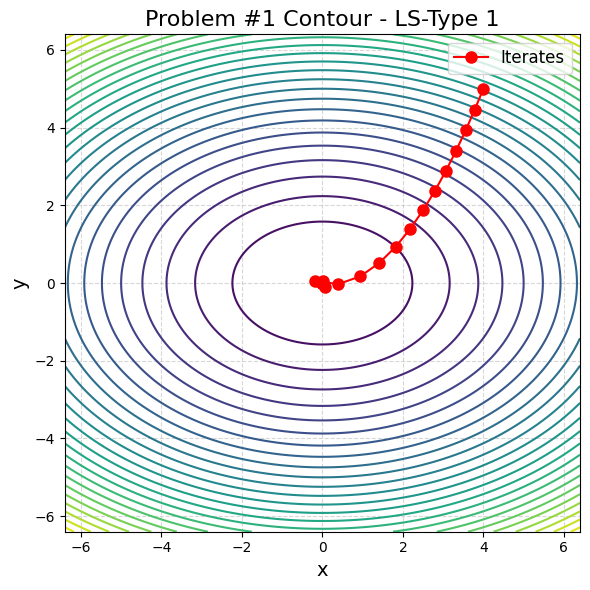

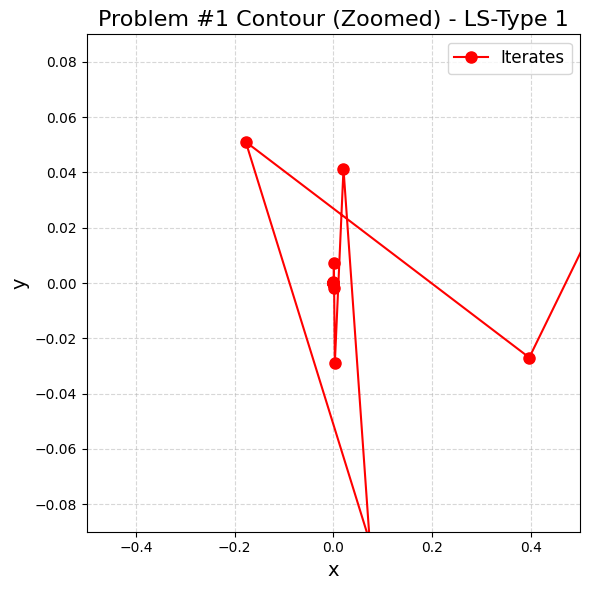

Final Solution: [ 4.61007897e-07 -6.24926992e-07]
New Value: 9.9359577291111e-13
Gradient Norm: 2.6643297575976185e-06
Iterations: 24

ls_type = 2


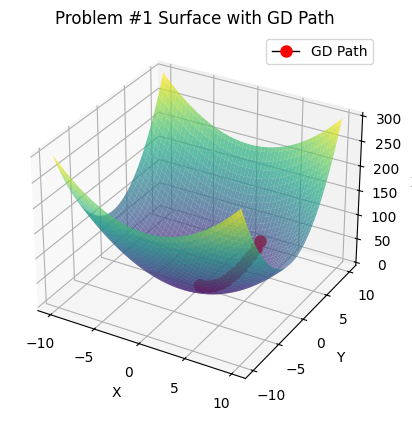

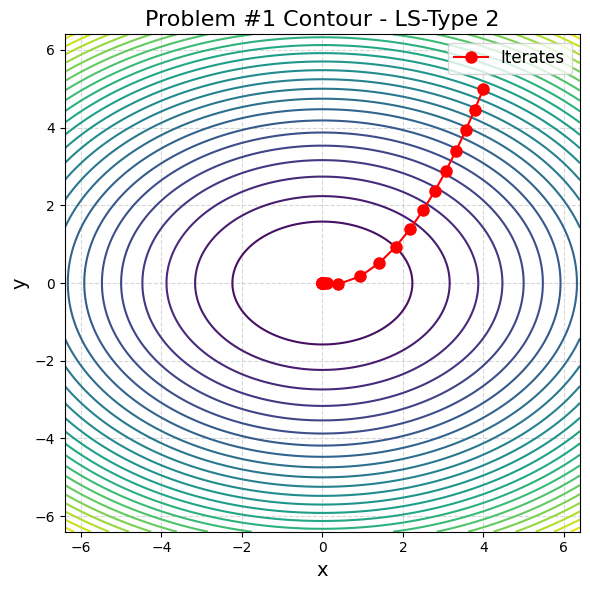

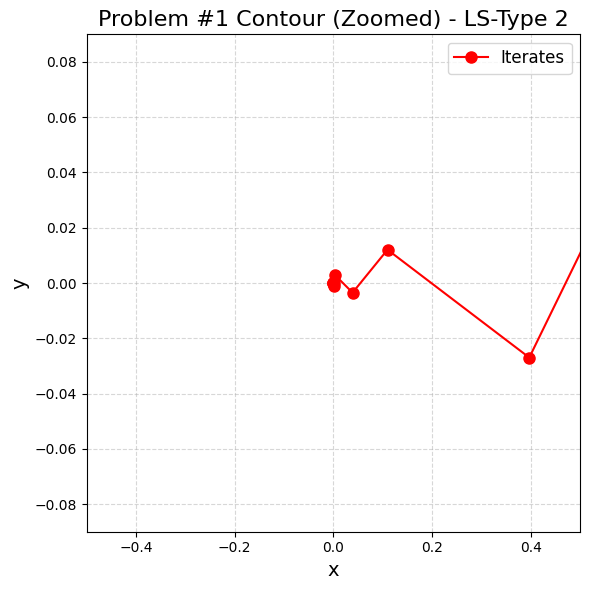

Final Solution: [-1.86215554e-06  2.08691828e-06]
New Value: 1.2178079098949252e-11
Gradient Norm: 9.14079536029269e-06
Iterations: 20


In [8]:
def fun(x):
    return x[0]**2 + 2*x[1]**2

def grad_fun(x):
    return np.array([2*x[0], 4*x[1]])

x_initial = np.array([4, 5])  # Starting Point should be kept same for fair comparison


ls_params = {
    "alpha_st": 0.58,  
    "rho": 0.5,  
    "c": 0.35,  
    "maxit": 100,  
    "grad_fun": grad_fun  
}

params_gd = {
    "tol": 1e-5,  
    "maxit": 70,  
    "ls_params": ls_params,  
    "grad_fun": grad_fun
}

ls_types = [0, 1, 2]

for ls in ls_types:
    print(f"\nls_type = {ls}")

    ls_params["ls_type"] = ls  

    final_x, iter_count, new_val, final_grad, last_norm, iter, norms, f_values, xs, ys = grad_descent(fun, x_initial, params_gd)

    fig, ax = plot_f(fun, 'Problem #1 Surface with GD Path')
    plot_gd_path_3d(fun, xs, ys, ax)
    plt.show()

    contour_graph(fun, xs, ys, title=f'Problem #1 Contour - LS-Type {ls}', limit_axis=False)
    contour_graph(fun, xs, ys, title=f'Problem #1 Contour (Zoomed) - LS-Type {ls}', limit_axis=True)


    print(f"Final Solution: {final_x}")
    print(f"New Value: {new_val}")
    print(f"Gradient Norm: {last_norm}")
    print(f"Iterations: {iter_count}")

#### **Problem 2**
We will work with the following quadratic function:

$$
f(x, y) = x^2 + \frac{1}{10} y^2
$$

The gradient of this function is:

$$
\nabla f(x, y) =
\begin{bmatrix}
2x \\
\frac{1}{5} y
\end{bmatrix}
$$

The function is convex and has a unique minimum at $(x, y) = (0, 0)$, meaning all three optimization methods should ideally converge to this point.

We will keep the initial starting point:

$$
x_{\text{initial}} =
\begin{bmatrix}
-5 \\
7
\end{bmatrix}
$$

for this problem. You are **NOT** allowed to change this value

### What Parameters can be changed
Paramters you are **not allowed** to change:
  - `tol` = 1e-5
  - `rho` = 0.5
  - `maxit` (for line search) = 30
  - `maxit` (for gradient descent) = 20
  - You must set the values to these in the `param_ls` and `param_grad` list
  - You can change the rest as you see fit.



ls_type = 0


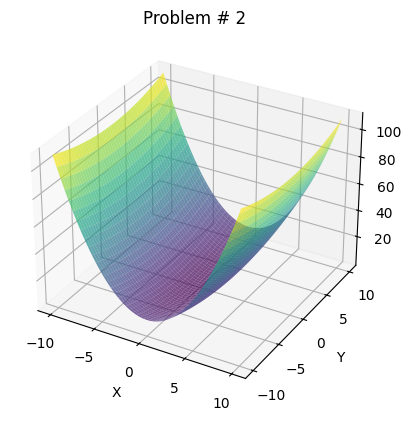

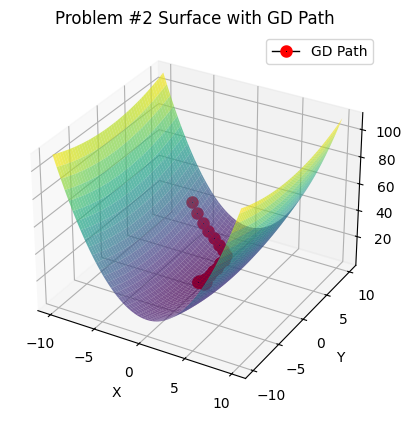

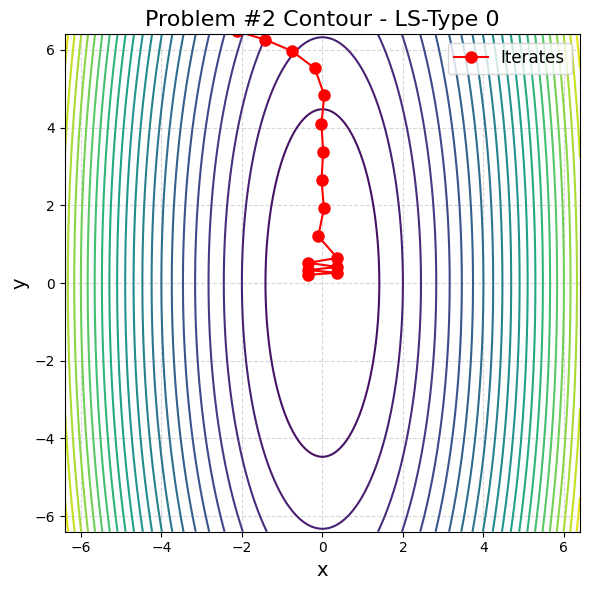

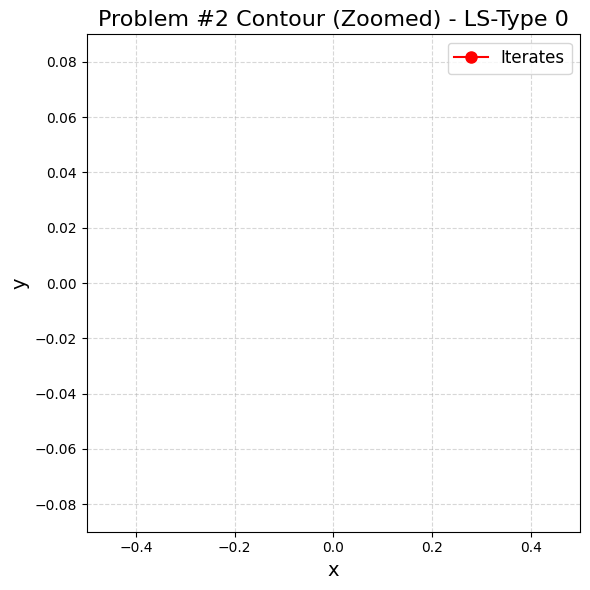

Final Solution: [0.37439916 0.1688815 ]
New Value: 0.14302682596892513
Gradient Norm: 0.7495597089636983
Iterations: 20

ls_type = 1


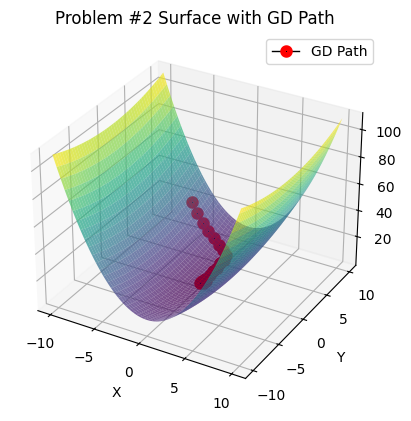

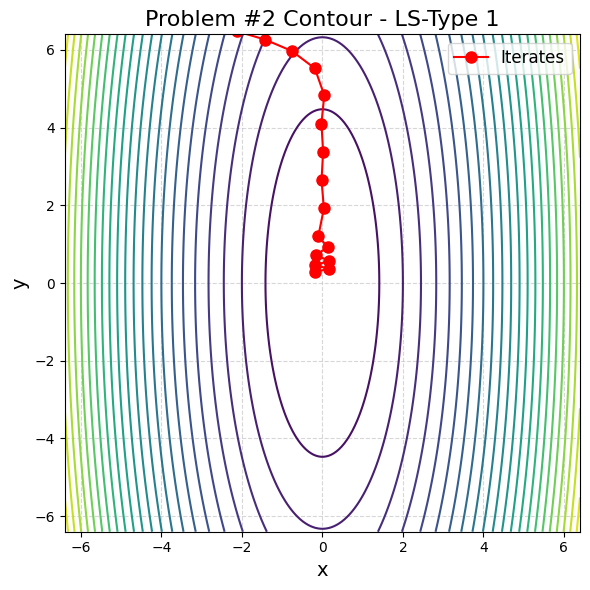

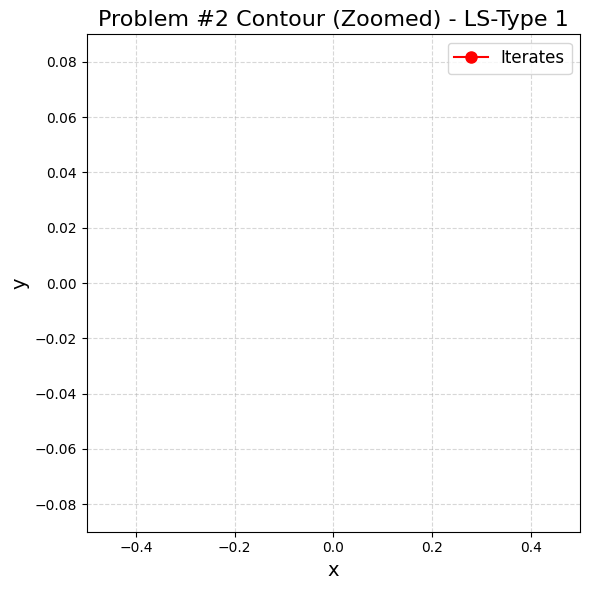

Final Solution: [0.17950724 0.23280844]
New Value: 0.0376428247318131
Gradient Norm: 0.36202124510007844
Iterations: 20

ls_type = 2


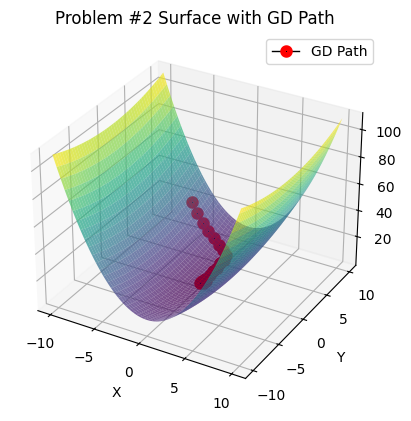

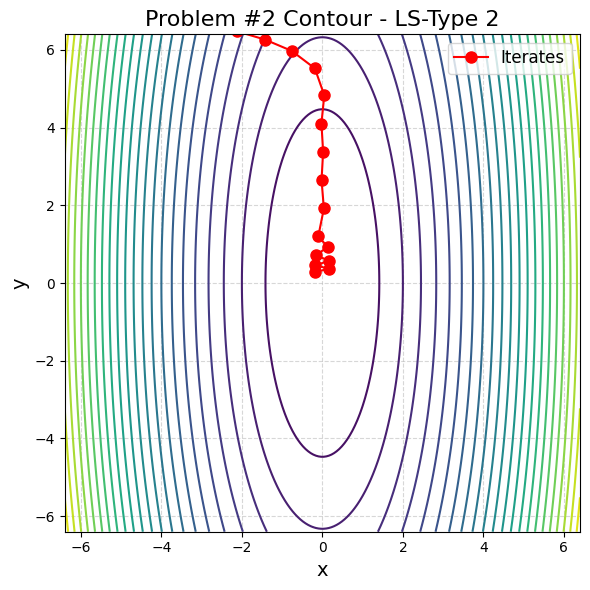

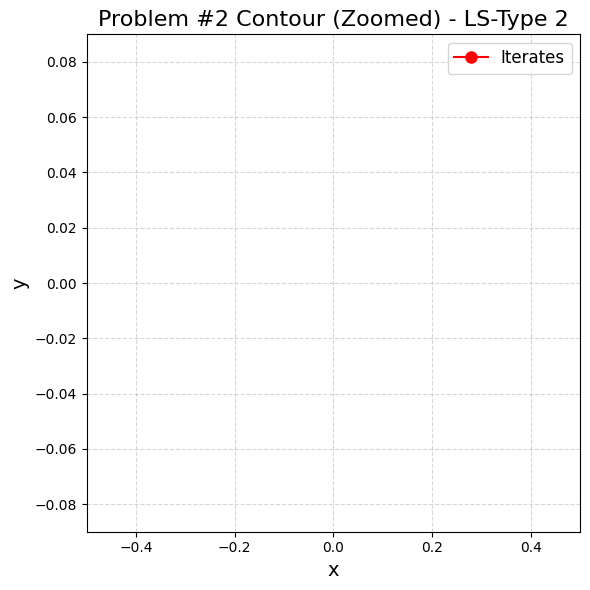

Final Solution: [0.17950724 0.23280844]
New Value: 0.0376428247318131
Gradient Norm: 0.36202124510007844
Iterations: 20


In [9]:
def fun(x):
    return x[0]**2 + (1/10)*x[1]**2

def grad_fun(x):
    return np.array([2*x[0], (1/5)*x[1]])

x_initial = np.array([-5, 7])

plot_f(fun, 'Problem # 2')

ls_params = {
    "alpha_st": 0.73,  
    "rho": 0.5,  
    "c": 1e-4,  
    "maxit": 30,  
    "grad_fun": grad_fun  
}

params_gd = {
    "tol": 1e-5,  
    "maxit": 20,  
    "ls_params": ls_params,  
    "grad_fun": grad_fun
}

ls_types = [0, 1, 2]

for ls in ls_types:
    print(f"\nls_type = {ls}")

    ls_params["ls_type"] = ls  

    final_x, iter_count, new_val, final_grad, last_norm, iter, norms, f_values, xs, ys = grad_descent(fun, x_initial, params_gd)

    fig, ax = plot_f(fun, 'Problem #2 Surface with GD Path')
    plot_gd_path_3d(fun, xs, ys, ax)
    plt.show()

    contour_graph(fun, xs, ys, title=f'Problem #2 Contour - LS-Type {ls}', limit_axis=False)
    contour_graph(fun, xs, ys, title=f'Problem #2 Contour (Zoomed) - LS-Type {ls}', limit_axis=True)


    print(f"Final Solution: {final_x}")
    print(f"New Value: {new_val}")
    print(f"Gradient Norm: {last_norm}")
    print(f"Iterations: {iter_count}")

#### Problem 3: Problem: Local Minima with Himmelblau's Function

The function is defined as:

$$
f(x, y) = \left(x^2 + y - 11\right)^2 + \left(x + y^2 - 7\right)^2
$$

#### **Gradient of Himmelblau's Function**

To optimize this function using gradient descent, you'll need its gradient. The partial derivatives are:

- Partial derivative with respect to $x$:

$$
\frac{\partial f}{\partial x} = 4x\left(x^2 + y - 11\right) + 2\left(x + y^2 - 7\right)
$$

- Partial derivative with respect to $y$:

$$
\frac{\partial f}{\partial y} = 2\left(x^2 + y - 11\right) + 4y\left(x + y^2 - 7\right)
$$

Thus, the gradient vector is:

$$
\nabla f(x, y) =
\begin{bmatrix}
4x\left(x^2 + y - 11\right) + 2\left(x + y^2 - 7\right) \\
2\left(x^2
+ y - 11\right) + 4y\left(x + y^2 - 7\right)
\end{bmatrix}
$$

We will keep the initial starting point:

$$
x_{\text{initial}} =
\begin{bmatrix}
1 \\
9
\end{bmatrix}
$$

### What Parameters can be changed
Paramters you are **not allowed** to change:
  - `tol` = 1e-5
  - `maxit` (for line search) = 100
  - `maxit` (for gradient descent) = 100
  - You must set the values to these in the `param_ls` and `param_grad` list
  - You can change the rest as you see fit.



ls_type = 0


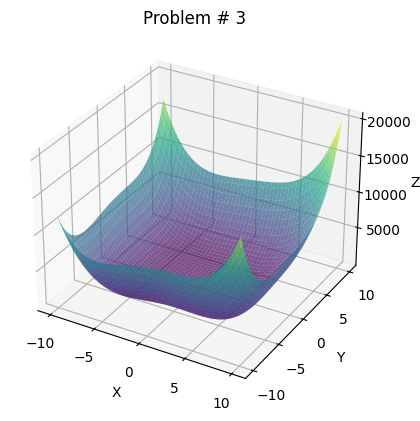

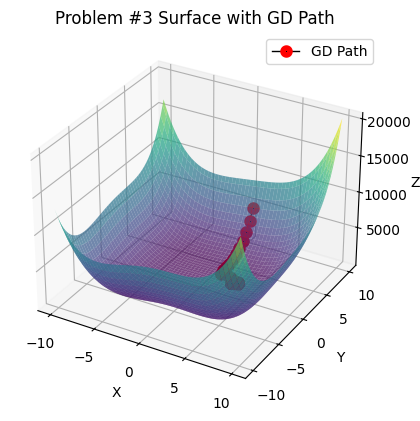

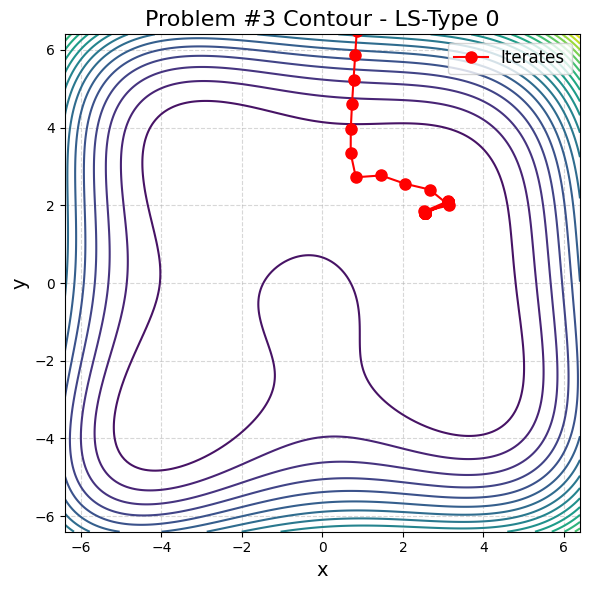

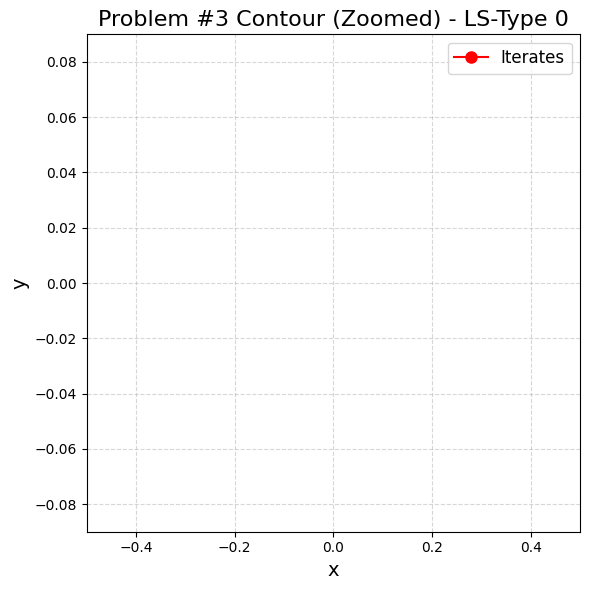

Final Solution: [3.12400762 2.07611394]
New Value: 0.8867019057364799
Gradient Norm: 12.480113022687448
Iterations: 100

ls_type = 1


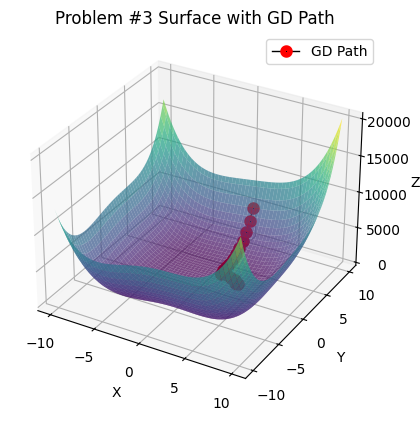

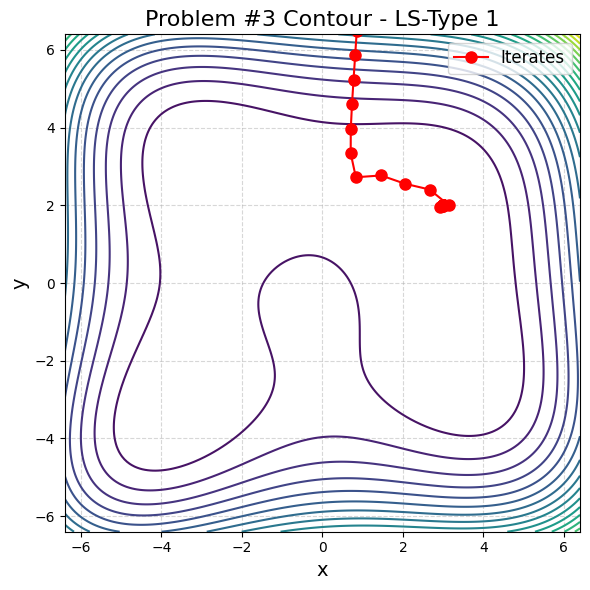

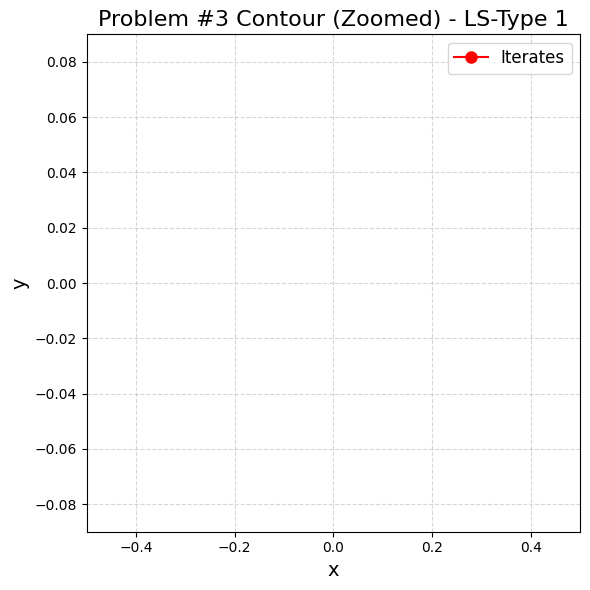

Final Solution: [2.99999997 1.99999992]
New Value: 2.0072091266525523e-13
Gradient Norm: 5.141366245466751e-06
Iterations: 29

ls_type = 2


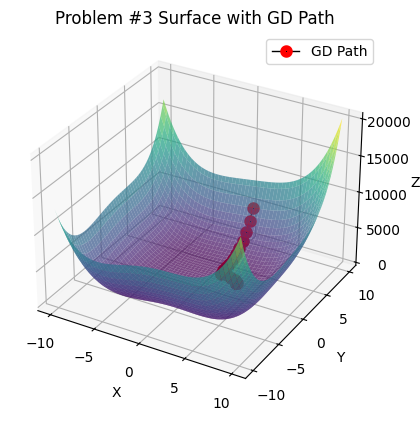

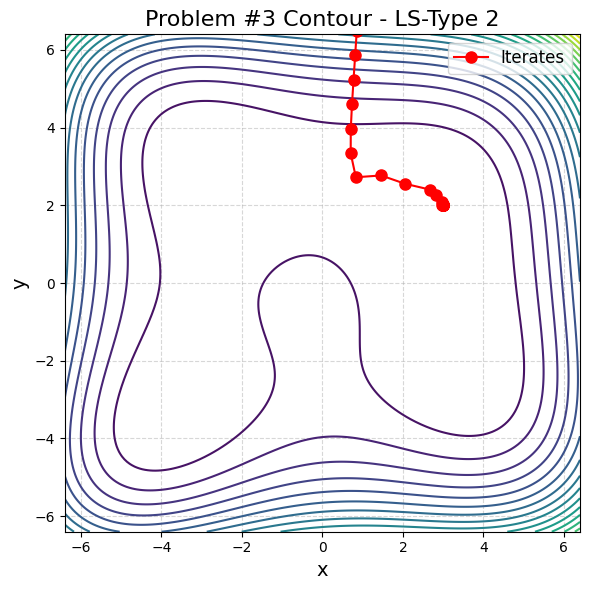

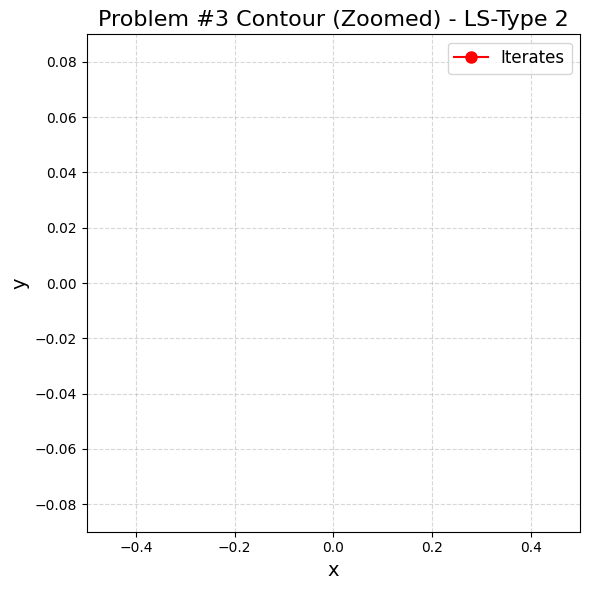

Final Solution: [2.99999999 2.00000019]
New Value: 5.844845705156107e-13
Gradient Norm: 7.095777531272393e-06
Iterations: 29


In [ ]:
def fun(x):
    return (x[0]**2 + x[1] - 11)**2 + (x[0] + x[1]**2 - 7)**2

def grad_fun(x):
    dfdx = 4*x[0]*(x[0]**2 + x[1] - 11) + 2*(x[0] + x[1]**2 - 7)
    dfdy = 2*(x[0]**2 + x[1] - 11) + 4*x[1]*(x[0] + x[1]**2 - 7)
    return np.array([dfdx, dfdy])

x_initial = np.array([1, 9])

plot_f(fun, 'Problem # 3')

ls_params = {
    "alpha_st": 0.63,  
    "rho": 0.35,  
    "c": 0.35,  
    "maxit": 100,  
    "grad_fun": grad_fun  
}

params_gd = {
    "tol": 1e-5,  
    "maxit": 100,  
    "ls_params": ls_params,  
    "grad_fun": grad_fun
}

ls_types = [0, 1, 2]

for ls in ls_types:
    print(f"\nls_type = {ls}")

    ls_params["ls_type"] = ls  

    final_x, iter_count, new_val, final_grad, last_norm, iter, norms, f_values, xs, ys = grad_descent(fun, x_initial, params_gd)

    fig, ax = plot_f(fun, 'Problem #3 Surface with GD Path')
    plot_gd_path_3d(fun, xs, ys, ax)
    plt.show()

    contour_graph(fun, xs, ys, title=f'Problem #3 Contour - LS-Type {ls}', limit_axis=False)
    contour_graph(fun, xs, ys, title=f'Problem #3 Contour (Zoomed) - LS-Type {ls}', limit_axis=True)


    print(f"Final Solution: {final_x}")
    print(f"New Value: {new_val}")
    print(f"Gradient Norm: {last_norm}")
    print(f"Iterations: {iter_count}")

#### Problem 4: Mini Ackley Function (^人^)

In this problem, you will work with a smaller version of the Ackley function—a popular test function in optimization due to its many local minima. We restrict the domain to $[-10, 10]$ for both $x$ and $y$ so that you can clearly see and analyze the landscape.

A common two-dimensional formulation of the Ackley function is:

$$
f(x, y) = -20 \exp\left(-0.2 \sqrt{0.5(x^2 + y^2)}\right) - \exp\left(0.5\left(\cos(2\pi x) + \cos(2\pi y)\right)\right) + e + 20.
$$

This function is highly multimodal, meaning it has many local minima, and is therefore a challenging benchmark for optimization algorithms. Note that we will only evaluate this function for $x, y \in [-10, 10]$.

We will keep the initial starting point:

$$
x_{\text{initial}} =
\begin{bmatrix}
1 \\
2
\end{bmatrix}
$$

### What Parameters can be changed
Paramters you are **not allowed** to change:
  - `tol` = 1e-5
  - `maxit` (for line search) = 100
  - `maxit` (for gradient descent) = 100
  - You must set the values to these in the `param_ls` and `param_grad` list
  - You can change the rest as you see fit.



ls_type = 0


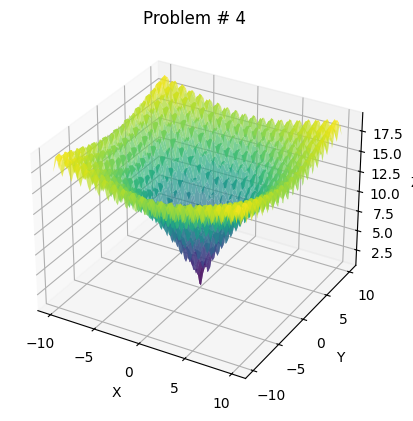

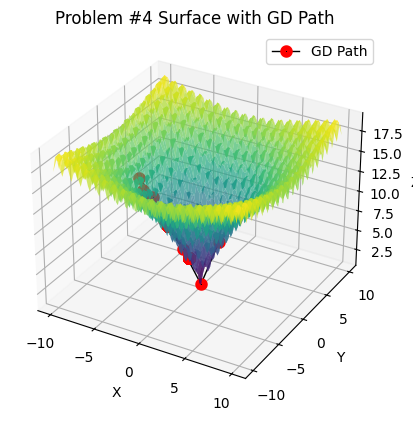

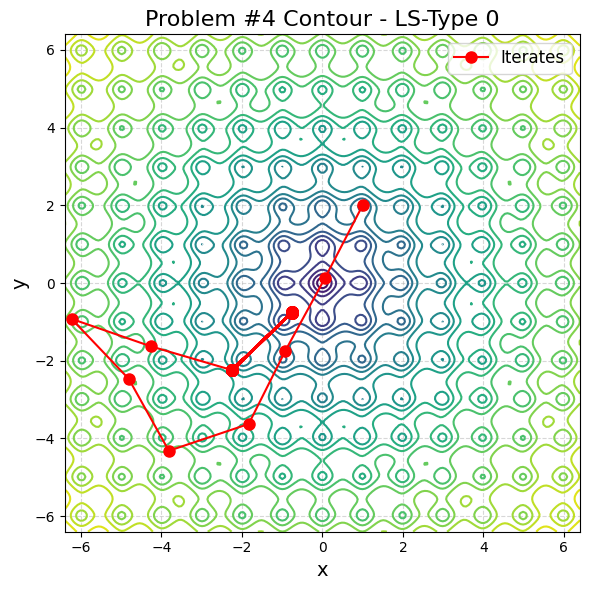

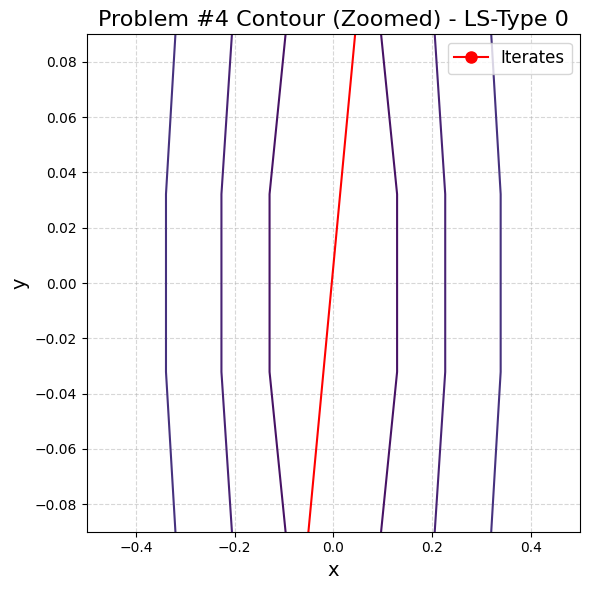

Final Solution: [-2.24517682 -2.23826741]
New Value: 8.891245023179652
Gradient Norm: 6.47895715461314
Iterations: 100

ls_type = 1


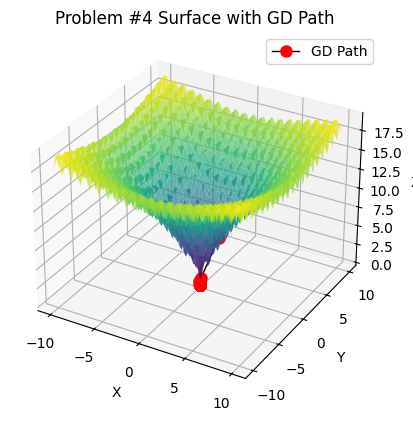

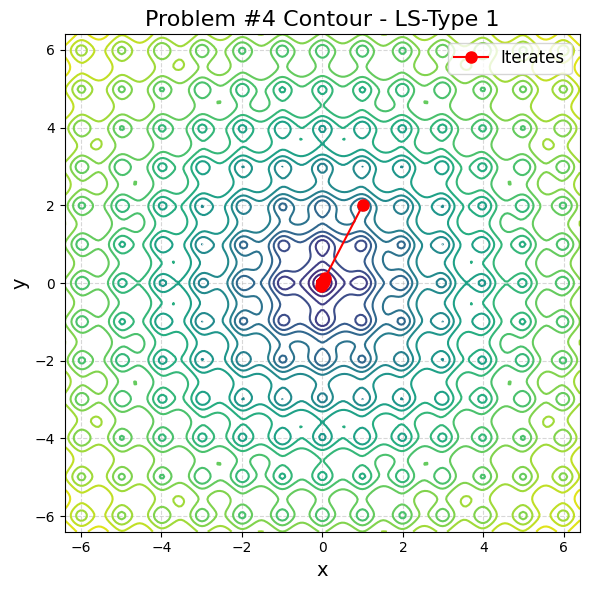

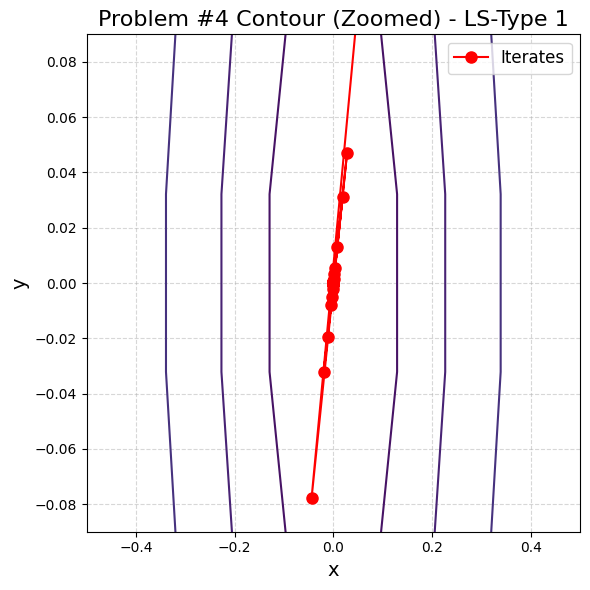

Final Solution: [-8.34060114e-11 -1.37963783e-10]
New Value: 4.559872479603655e-10
Gradient Norm: 2.828427133332023
Iterations: 100

ls_type = 2


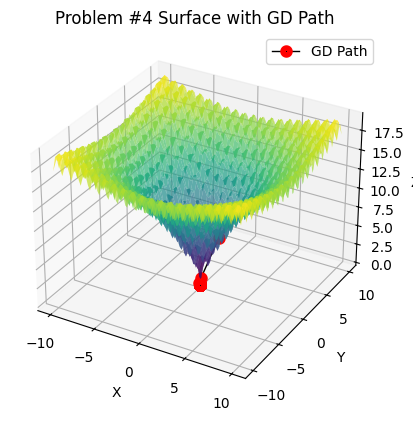

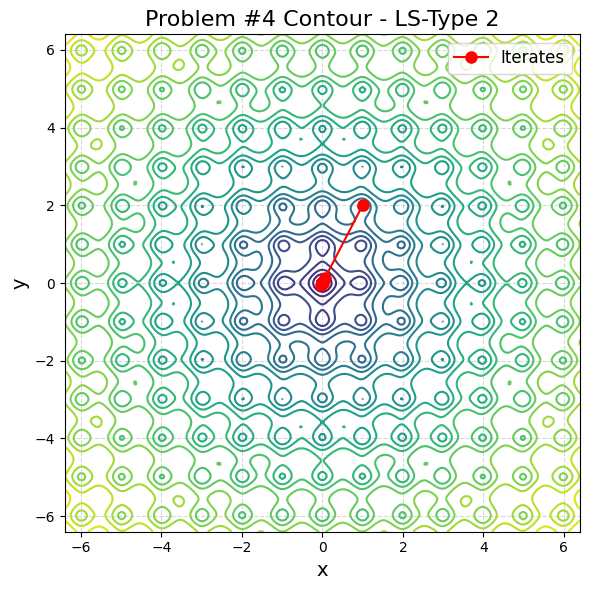

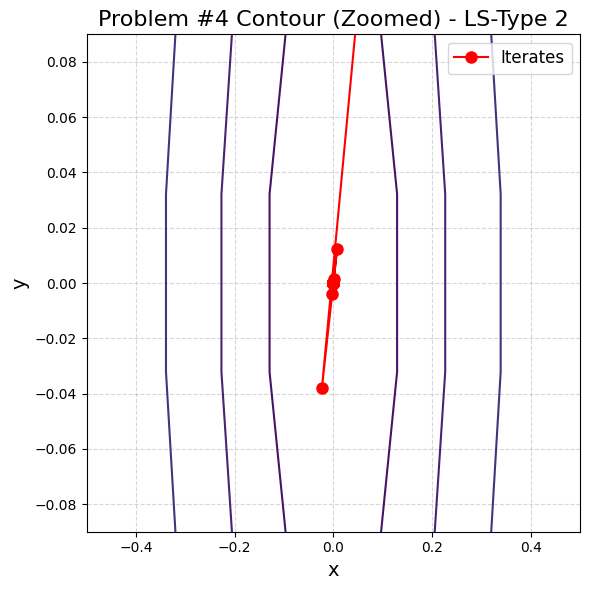

Final Solution: [-8.08857905e-11 -1.31276835e-10]
New Value: 4.361275784958707e-10
Gradient Norm: 2.8284271329581157
Iterations: 100


In [11]:
def fun(x):
    # First term: -20 * exp(-0.2 * sqrt(0.5*(x^2 + y^2)))
    term1 = -20 * np.exp(-0.2 * np.sqrt(0.5 * (x[0]**2 + x[1]**2)))

    # Second term: -exp(0.5*(cos(2*pi*x) + cos(2*pi*y)))
    term2 = -np.exp(0.5 * (np.cos(2 * np.pi * x[0]) + np.cos(2 * np.pi * x[1])))

    # Combine the terms with constants: e + 20
    return term1 + term2 + np.e + 20

def grad_fun(x):
    # Compute A = sqrt((x^2+y^2)/2)
    A = np.sqrt((x[0]**2 + x[1]**2) / 2)

    # Derivative of the first term T1 = -20 exp(-0.2A)
    dT1_dx = (2 * x[0] / A) * np.exp(-0.2 * A)
    dT1_dy = (2 * x[1] / A) * np.exp(-0.2 * A)

    # Common factor for the second term
    common_factor = np.exp(0.5 * (np.cos(2 * np.pi * x[0]) + np.cos(2 * np.pi * x[1])))

    # Derivative of the second term T2 = -exp(0.5*(cos(2πx)+cos(2πy)))
    dT2_dx = np.pi * np.sin(2 * np.pi * x[0]) * common_factor
    dT2_dy = np.pi * np.sin(2 * np.pi * x[1]) * common_factor

    # Sum the derivatives for the total gradient
    grad_x = dT1_dx + dT2_dx
    grad_y = dT1_dy + dT2_dy

    return np.array([grad_x, grad_y])

x_initial = np.array([1, 2])  # Starting Point should be kept same for fair comparison
plot_f(fun, 'Problem # 4')

ls_params = {
    "alpha_st": 2.1,  
    "rho": 0.8,  
    "c": 0.4,  
    "maxit": 100,  
    "grad_fun": grad_fun  
}

params_gd = {
    "tol": 1e-5,  
    "maxit": 100,  
    "ls_params": ls_params,  
    "grad_fun": grad_fun
}

ls_types = [0, 1, 2]

for ls in ls_types:
    print(f"\nls_type = {ls}")

    ls_params["ls_type"] = ls  

    final_x, iter_count, new_val, final_grad, last_norm, iter, norms, f_values, xs, ys = grad_descent(fun, x_initial, params_gd)

    fig, ax = plot_f(fun, 'Problem #4 Surface with GD Path')
    plot_gd_path_3d(fun, xs, ys, ax)
    plt.show()

    contour_graph(fun, xs, ys, title=f'Problem #4 Contour - LS-Type {ls}', limit_axis=False)
    contour_graph(fun, xs, ys, title=f'Problem #4 Contour (Zoomed) - LS-Type {ls}', limit_axis=True)


    print(f"Final Solution: {final_x}")
    print(f"New Value: {new_val}")
    print(f"Gradient Norm: {last_norm}")
    print(f"Iterations: {iter_count}")

#### **Problem 5: Rastrigin Function**

Rastrigin’s function is well-known in global optimization for its **large search space** and **numerous local minima**. Despite having a single global minimum at \((0, 0)\), the function’s highly oscillatory nature often misleads local search methods like gradient descent.

A common 2D version of the Rastrigin function is:

$$
f(x, y) = 20 + \bigl[x^2 - 10 \cos(2 \pi x)\bigr] + \bigl[y^2 - 10 \cos(2 \pi y)\bigr].
$$

To apply gradient-based methods, you’ll need the partial derivatives:  

$$
\frac{\partial f}{\partial x} = 2x + 20\pi \sin(2\pi x)
$$

$$
\frac{\partial f}{\partial y} = 2y + 20\pi \sin(2\pi y)
$$

We will keep the initial starting point:

$$
x_{\text{initial}} =
\begin{bmatrix}
2 \\
5
\end{bmatrix}
$$

### What Parameters can be changed
Paramters you are **not allowed** to change:
  - `tol` = 1e-5
  - `maxit` (for line search) = 100
  - `maxit` (for gradient descent) = 100
  - You must set the values to these in the `param_ls` and `param_grad` list
  - You can change the rest as you see fit.



ls_type = 0


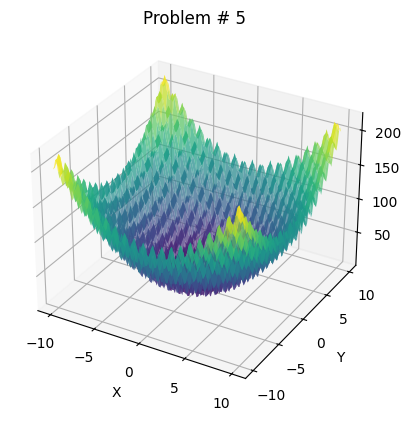

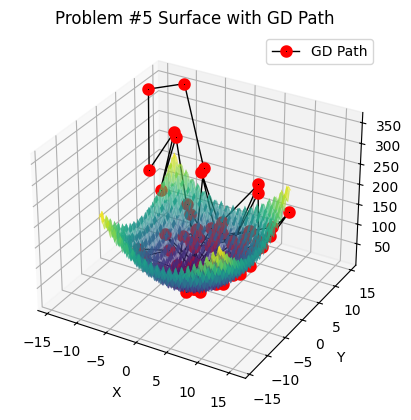

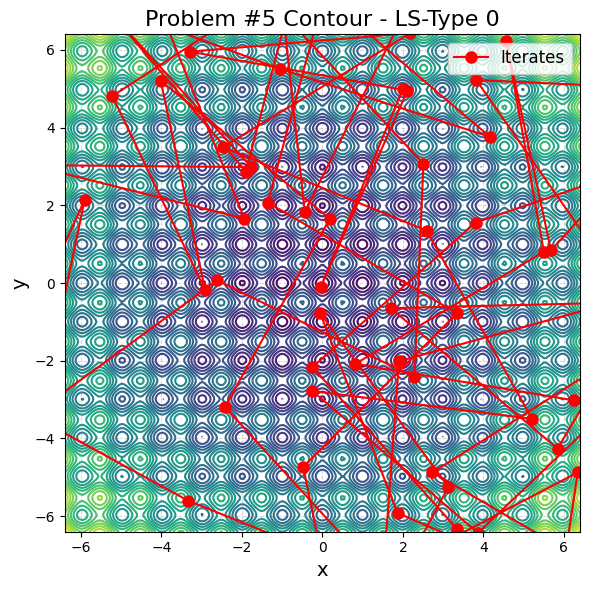

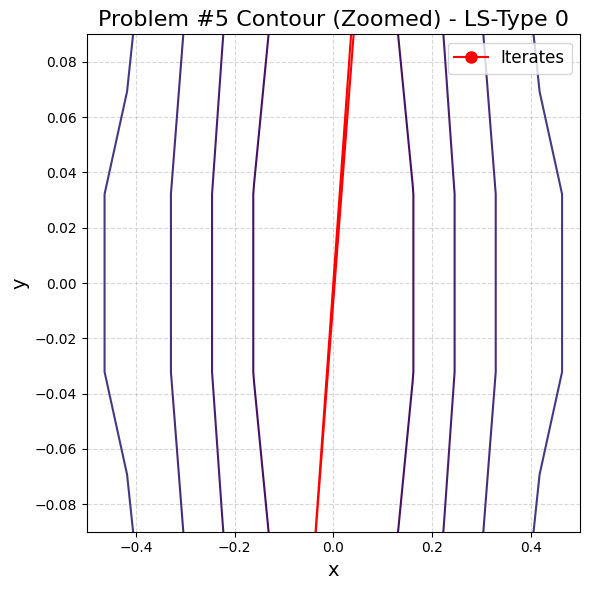

Final Solution: [ 8.84966772 -3.02219977]
New Value: 91.68648414831625
Gradient Norm: 36.350186818296436
Iterations: 100

ls_type = 1


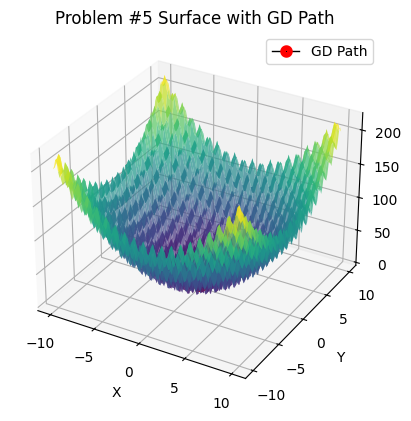

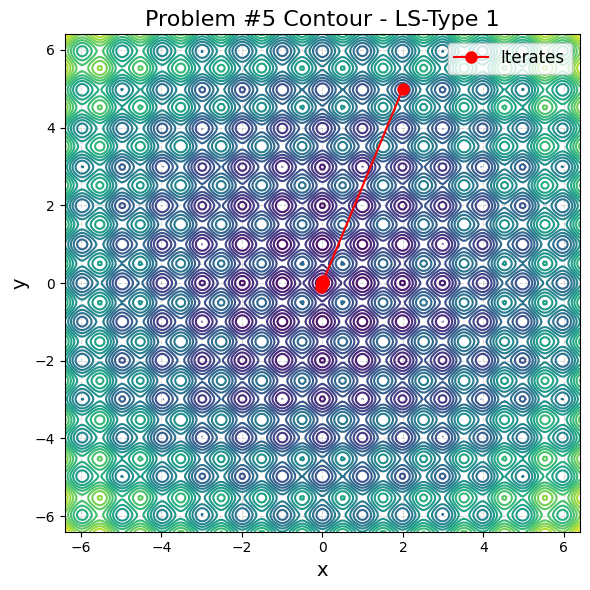

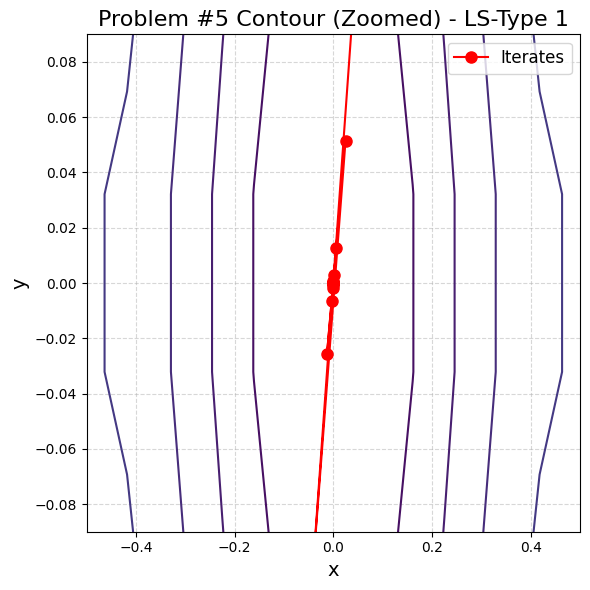

Final Solution: [7.82948947e-09 1.54524476e-08]
New Value: 5.861977570020827e-14
Gradient Norm: 6.87340881915766e-06
Iterations: 19

ls_type = 2


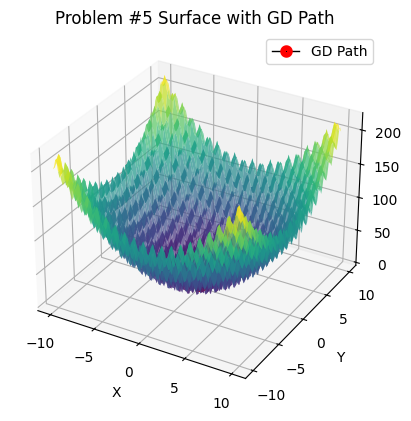

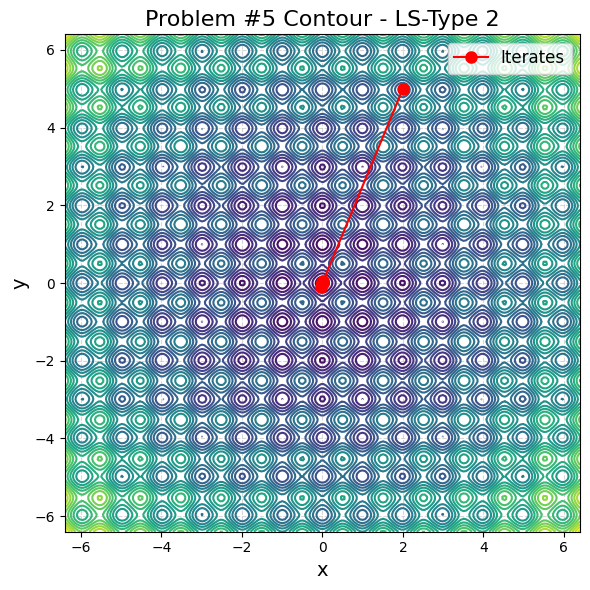

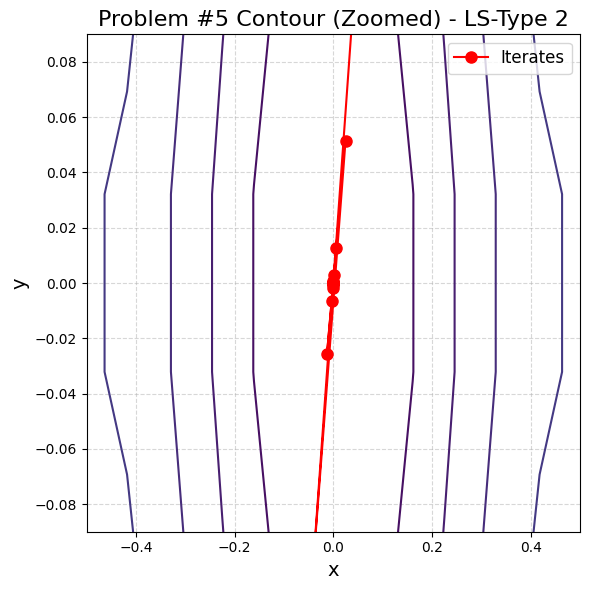

Final Solution: [7.82948947e-09 1.54524476e-08]
New Value: 5.861977570020827e-14
Gradient Norm: 6.87340881915766e-06
Iterations: 19


In [12]:
def fun(x):
    A = 10
    x_val, y_val = x[0], x[1]
    return (2 * A
            + (x_val**2 - A * np.cos(2 * np.pi * x_val))
            + (y_val**2 - A * np.cos(2 * np.pi * y_val)))


def grad_fun(x):
    x_val, y_val = x[0], x[1]
    grad_x = 2 * x_val + 20 * np.pi * np.sin(2 * np.pi * x_val)
    grad_y = 2 * y_val + 20 * np.pi * np.sin(2 * np.pi * y_val)
    return np.array([grad_x, grad_y])

x_initial = np.array([2, 5])  # Starting Point should be kept same for fair comparison
plot_f(fun, 'Problem # 5')

ls_params = {
    "alpha_st": 5.5,  
    "rho": 0.5,  
    "c": 1e-6,  
    "maxit": 100,  
    "grad_fun": grad_fun  
}

params_gd = {
    "tol": 1e-5,  
    "maxit": 100,  
    "ls_params": ls_params,  
    "grad_fun": grad_fun
}

ls_types = [0, 1, 2]

for ls in ls_types:
    print(f"\nls_type = {ls}")

    ls_params["ls_type"] = ls  

    final_x, iter_count, new_val, final_grad, last_norm, iter, norms, f_values, xs, ys = grad_descent(fun, x_initial, params_gd)

    fig, ax = plot_f(fun, 'Problem #5 Surface with GD Path')
    plot_gd_path_3d(fun, xs, ys, ax)
    plt.show()

    contour_graph(fun, xs, ys, title=f'Problem #5 Contour - LS-Type {ls}', limit_axis=False)
    contour_graph(fun, xs, ys, title=f'Problem #5 Contour (Zoomed) - LS-Type {ls}', limit_axis=True)


    print(f"Final Solution: {final_x}")
    print(f"New Value: {new_val}")
    print(f"Gradient Norm: {last_norm}")
    print(f"Iterations: {iter_count}")

## Task 4 Problem Solving using Adam and Adadelta

Now you will be using your ADAM and Adadelta functions with absolute freedom on hyperparameters. There maybe some repeated problems from above but their initial values are different. Keep whatever parameters you want, no need to keep the same parameters for AdaDelta and Adam.

### What you need to do?

- Run Adam and AdaDelta for these problems.
- Plot the path your alogirthm took on your 3D graphs using the helper functions above. You do not need to make the contour plots this time. Remember to properly label your graphs, we will **deduct marks** for poorly labelled graphs.
- For each problem there will be some benchmark you will need to achieve.
- Report the following values:
  - Final value of x.
  - Final function value.
  - Final gradient norm.
  - Iteration count. They should be printed in the following format
  ```python
  
    print(f"Final x: {np.around(x_final, 4)}, Final f(x): {f_final:.6g}, \n Final grad norm: {grad_norm:.6g}, Iterations: {iters}")
  ```

Again we will be more focused on your $f(x)$ and iterations count.

In this table, you can find all the benchmarks you need to achieve

| **Problem**    | **Optimizer** | **Baseline f(x)** | **Baseline Iterations** |
|---------------|--------------|-------------------|-------------------------|
| Rosenbrock    | Adam         | 0.5          | 10000                   |
| Rosenbrock    | AdaDelta     | 0.5          | 10000                   |
| Himmelblau    | Adam         | 50           | 100                     |
| Himmelblau    | AdaDelta     | 4400           | 100                     |
| Rastrigin     | Adam         | 50            | 110                     |
| Rastrigin     | AdaDelta     | 50            | 18                      |


#### Problem 1: Rosenbrock Function

The **Rosenbrock function** is a well-known test function for optimization algorithms due to its narrow, curved valley. In 2D, it is defined as:

$$
f(x, y) = (a - x)^2 + b(y - x^2)^2
$$

with typical parameters $a = 1$ and $b = 100$.

**Gradient:**

The gradient (i.e., the vector of partial derivatives) of the Rosenbrock function is:

$$
\frac{\partial f}{\partial x} = -2(a - x) - 4b\,x\,(y - x^2)
$$
$$
\frac{\partial f}{\partial y} = 2b\,(y - x^2)
$$

*Explanation:*  
- The $x$-component captures both the direct error $(a - x)$ and the curvature effect from the term $y - x^2$.
- The $y$-component is simpler, reflecting the vertical distance from the parabola $y = x^2$.

We will keep the initial starting point:

$$
x_{\text{initial}} =
\begin{bmatrix}
-8 \\
2
\end{bmatrix}
$$



Adam Optimizer on Rosenbrock:
Final x: [0.4049 0.1636], Final f(x): 0.354118, 
Final grad norm: 1.13608, Iterations: 10000


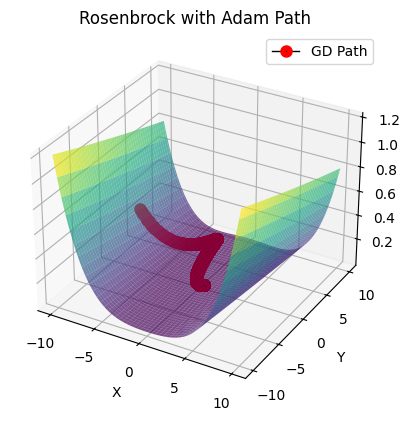


AdaDelta Optimizer on Rosenbrock:
Final x: [0.7125 0.4442], Final f(x): 0.484367, 
Final grad norm: 21.5984, Iterations: 10000


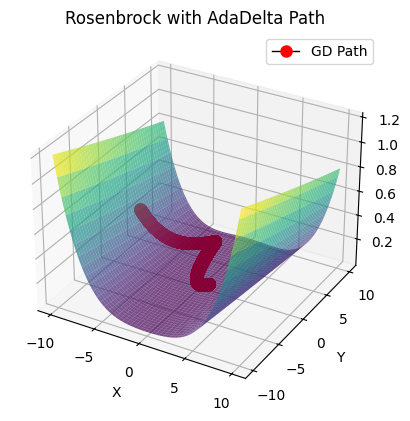

In [13]:
def rosenbrock_function(x, a=1, b=100):
    x_val, y = x[0], x[1]
    return (a - x_val)**2 + b*(y - x_val**2)**2

def rosenbrock_grad(x, a=1, b=100):
    x_val, y = x[0], x[1]
    dfdx = -2*(a - x_val) - 4*b*x_val*(y - x_val**2)
    dfdy = 2*b*(y - x_val**2)
    return np.array([dfdx, dfdy])

# Plot the function

x_initial = np.array([-8.0, 2.0])

adam_lr = 0.1
adam_maxit = 10000
adadelta_rho = 0.95
adadelta_maxit = 10000

x_final_adam, f_final_adam, grad_norm_adam, iters_adam, path_adam = adam_optimizer(
    rosenbrock_function, rosenbrock_grad, x_initial, lr=adam_lr, tol=1e-5, maxit=adam_maxit
)
print(f"Adam Optimizer on Rosenbrock:")
print(f"Final x: {np.around(x_final_adam, 4)}, Final f(x): {f_final_adam:.6g}, \nFinal grad norm: {grad_norm_adam:.6g}, Iterations: {iters_adam}")



fig, ax = plot_f(rosenbrock_function, 'Rosenbrock with Adam Path')
xs_adam = [pt[0] for pt in path_adam]
ys_adam = [pt[1] for pt in path_adam]
plot_gd_path_3d(rosenbrock_function, xs_adam, ys_adam, ax)
plt.show()

x_final_adadelta, f_final_adadelta, grad_norm_adadelta, iters_adadelta, path_adadelta = adadelta_optimizer(
    rosenbrock_function, rosenbrock_grad, x_initial, rho=adadelta_rho, tol=1e-5, maxit=adadelta_maxit
)
print(f"\nAdaDelta Optimizer on Rosenbrock:")
print(f"Final x: {np.around(x_final_adadelta, 4)}, Final f(x): {f_final_adadelta:.6g}, \nFinal grad norm: {grad_norm_adadelta:.6g}, Iterations: {iters_adadelta}")

fig, ax = plot_f(rosenbrock_function, 'Rosenbrock with AdaDelta Path')
xs_ada = [pt[0] for pt in path_adadelta]
ys_ada = [pt[1] for pt in path_adadelta]
plot_gd_path_3d(rosenbrock_function, xs_ada,ys_ada, ax)
plt.show()

#### Problem 2: Let's Revisit Himmelblau's function

But this time we will keep the initial starting point:

$$
x_{\text{initial}} =
\begin{bmatrix}
1 \\
9
\end{bmatrix}
$$


Adam Optimizer on himmelblau:
Final x: [-2.8171  4.0247], Final f(x): 41.6432, 
Final grad norm: 104.67, Iterations: 100


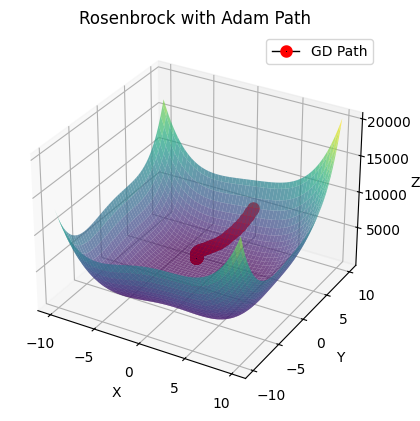


AdaDelta Optimizer on himmelblau:
Final x: [0.3267 8.346 ], Final f(x): 3973.36, 
Final grad norm: 2101.13, Iterations: 100


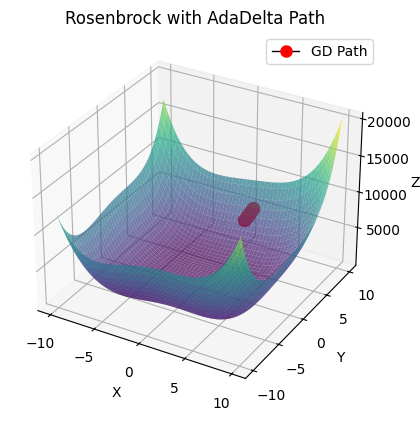

In [14]:
def himmelblau_function(x):
    return (x[0]**2 + x[1] - 11)**2 + (x[0] + x[1]**2 - 7)**2

def himmelblau_grad(x):
    dfdx = 4*x[0]*(x[0]**2 + x[1] - 11) + 2*(x[0] + x[1]**2 - 7)
    dfdy = 2*(x[0]**2 + x[1] - 11) + 4*x[1]*(x[0] + x[1]**2 - 7)
    return np.array([dfdx, dfdy])

x_initial = np.array([1.0, 9.0])

adam_lr = 0.1
adam_maxit = 100
adadelta_rho = 0.98
adadelta_maxit = 100

x_final_adam, f_final_adam, grad_norm_adam, iters_adam, path_adam = adam_optimizer(
    himmelblau_function, himmelblau_grad, x_initial, lr=adam_lr, tol=1e-5, maxit=adam_maxit
)
print(f"Adam Optimizer on himmelblau:")
print(f"Final x: {np.around(x_final_adam, 4)}, Final f(x): {f_final_adam:.6g}, \nFinal grad norm: {grad_norm_adam:.6g}, Iterations: {iters_adam}")



fig, ax = plot_f(himmelblau_function, 'Rosenbrock with Adam Path')
xs_adam = [pt[0] for pt in path_adam]
ys_adam = [pt[1] for pt in path_adam]
plot_gd_path_3d(himmelblau_function, xs_adam, ys_adam, ax)
plt.show()

x_final_adadelta, f_final_adadelta, grad_norm_adadelta, iters_adadelta, path_adadelta = adadelta_optimizer(
    himmelblau_function, himmelblau_grad, x_initial, rho=adadelta_rho, tol=1e-5, maxit=adadelta_maxit
)
print(f"\nAdaDelta Optimizer on himmelblau:")
print(f"Final x: {np.around(x_final_adadelta, 4)}, Final f(x): {f_final_adadelta:.6g}, \nFinal grad norm: {grad_norm_adadelta:.6g}, Iterations: {iters_adadelta}")

fig, ax = plot_f(himmelblau_function, 'Rosenbrock with AdaDelta Path')
xs_ada = [pt[0] for pt in path_adadelta]
ys_ada = [pt[1] for pt in path_adadelta]
plot_gd_path_3d(himmelblau_function, xs_ada,ys_ada, ax)
plt.show()

#### Problem 2: Lets Revisit Rastrigin Function

But now we will keep the initial starting point:

$$
x_{\text{initial}} =
\begin{bmatrix}
-4 \\
5
\end{bmatrix}
$$

Adam Optimizer on Rosenbrock:
Final x: [-3.9796  4.9749], Final f(x): 40.793, 
Final grad norm: 0.124439, Iterations: 110


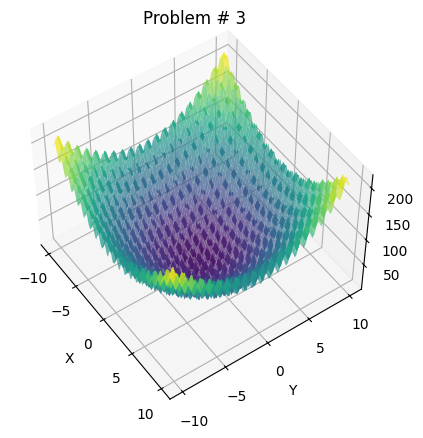

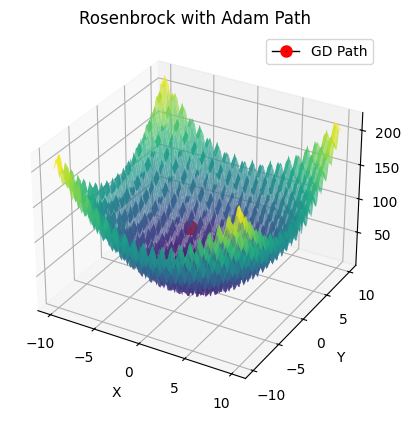


AdaDelta Optimizer on Rosenbrock:
Final x: [-3.9798  4.9749], Final f(x): 40.793, 
Final grad norm: 0.0838405, Iterations: 18


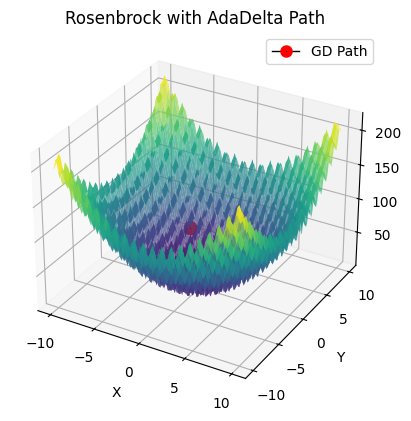

In [15]:
def rastrigin_fun(x):
    A = 10
    x_val, y_val = x[0], x[1]
    return (2 * A
            + (x_val**2 - A * np.cos(2 * np.pi * x_val))
            + (y_val**2 - A * np.cos(2 * np.pi * y_val)))


def rastrigin_grad_fun(x):
    x_val, y_val = x[0], x[1]
    grad_x = 2 * x_val + 20 * np.pi * np.sin(2 * np.pi * x_val)
    grad_y = 2 * y_val + 20 * np.pi * np.sin(2 * np.pi * y_val)
    return np.array([grad_x, grad_y])

fig, axis = plot_f(rastrigin_fun, 'Problem # 3')
axis.view_init(elev=50, azim=-35)

x_initial = np.array([-4.0, 5.0])

adam_lr = 0.1
adam_maxit = 110
adadelta_rho = 0.95
adadelta_maxit = 18

x_final_adam, f_final_adam, grad_norm_adam, iters_adam, path_adam = adam_optimizer(
    rastrigin_fun, rastrigin_grad_fun, x_initial, lr=adam_lr, tol=1e-5, maxit=adam_maxit
)
print(f"Adam Optimizer on Rosenbrock:")
print(f"Final x: {np.around(x_final_adam, 4)}, Final f(x): {f_final_adam:.6g}, \nFinal grad norm: {grad_norm_adam:.6g}, Iterations: {iters_adam}")



fig, ax = plot_f(rastrigin_fun, 'Rosenbrock with Adam Path')
xs_adam = [pt[0] for pt in path_adam]
ys_adam = [pt[1] for pt in path_adam]
plot_gd_path_3d(rastrigin_fun, xs_adam, ys_adam, ax)
plt.show()

x_final_adadelta, f_final_adadelta, grad_norm_adadelta, iters_adadelta, path_adadelta = adadelta_optimizer(
    rastrigin_fun, rastrigin_grad_fun, x_initial, rho=adadelta_rho, tol=1e-5, maxit=adadelta_maxit
)
print(f"\nAdaDelta Optimizer on Rosenbrock:")
print(f"Final x: {np.around(x_final_adadelta, 4)}, Final f(x): {f_final_adadelta:.6g}, \nFinal grad norm: {grad_norm_adadelta:.6g}, Iterations: {iters_adadelta}")

fig, ax = plot_f(rastrigin_fun, 'Rosenbrock with AdaDelta Path')
xs_ada = [pt[0] for pt in path_adadelta]
ys_ada = [pt[1] for pt in path_adadelta]
plot_gd_path_3d(rastrigin_fun, xs_ada,ys_ada, ax)
plt.show()

## Part 4: Report your findings

### Note: We will not mark your notebook if you do not complete this section


# Gradient Descent

Lets start with your Gradient Results first, then we will move onto ADAM and AdaDelta

## Section A:  Results Table
Fill the table for each problem comparing your results against the baseline (only reporting **new_value** and **iter_count**). You will **not be penalised** if your values are close (within 0.1) to baseline but not beating them.

| Problem | ls_type | Baseline new_value | Your new_value | Baseline iter_count | Your iter_count |
|---------|---------|--------------------|----------------|---------------------|-----------------|
| 1       | 0       | 0.181              |    0.116            | 90                  |    70             |
| 1       | 1       | 1.65e-12           |     9.93e-13           | 20                  |     24            |
| 1       | 2       | 1.06e-11           |       1.21e-11         | 30                  |            20     |
| 2       | 0       | 1.0098             |     0.143           | 20                  |        20         |
| 2       | 1       | 1.18e-3            |      0.0376          | 20                  |     20            |
| 2       | 2       | 1.72e-3            |         0.0376       | 20                   |        20         |
| 3       | 0       | 16.6401            |     0.233           | 100                 |         100        |
| 3       | 1       | 7.79e-14           |      2.007e-13          | 25                  |    26             |
| 3       | 2       | 1.09e-12           |         5.844e-13       | 35                  |       29          |
| 4       | 0       | 10.0686            |      8.89          | 100                 |     100            |
| 4       | 1       | ≈ 4.0              |        4.55e-10        | 100                 |        100         |
| 4       | 2       | ≈ 3.0              |         4.36e-10       | 100                 |      100           |
| 5       | 0       | 296.1788           |     91.68           | 100                 |        100         |
| 5       | 1       | 4.9748             |           5.86e-14     | 20                  |    19             |
| 5       | 2       | 1.9899             |            5.86e-14    | 35                  |              19   |

---


## Section B: 3D Grid Plot Display

For each problem, you are required to create a **grid of side-by-side 3D contour plots** showing the function landscape and the gradient descent paths for each `ls_type`.  
- **Tip:** Use subplots (e.g., `plt.subplot(1, 3, i+1)`) to display the three views together.
- Include a title for each subplot indicating the corresponding `ls_type`.


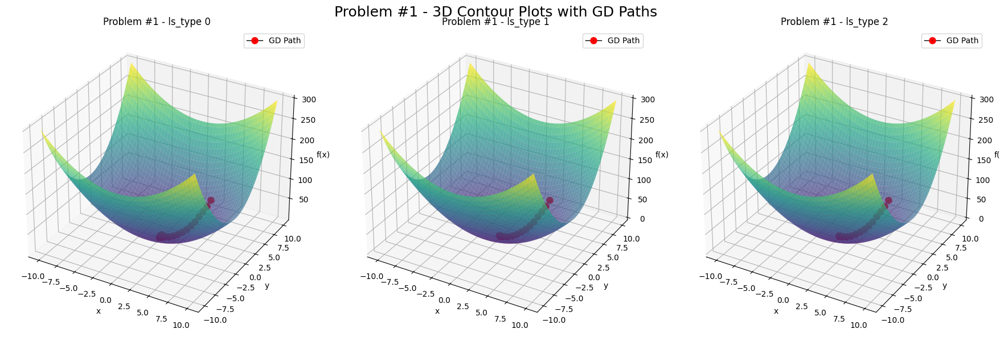

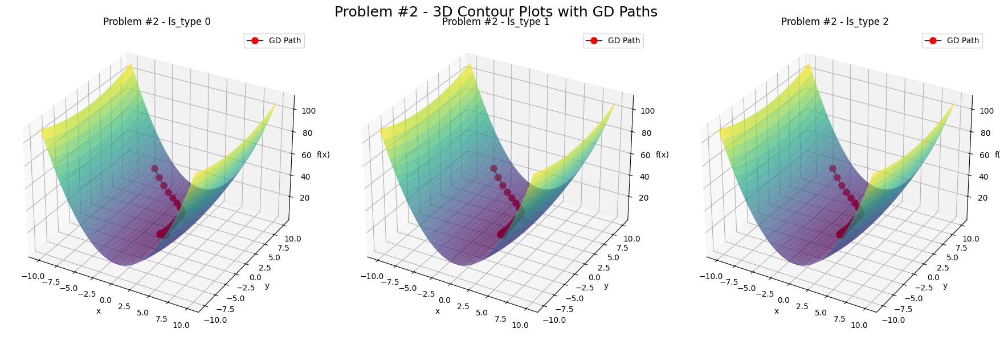

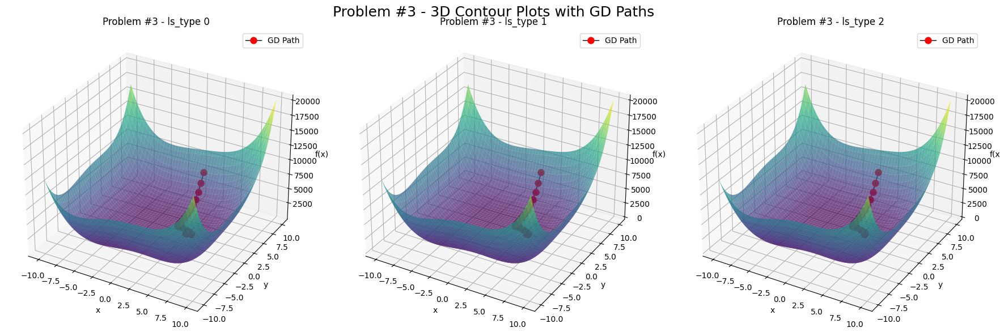

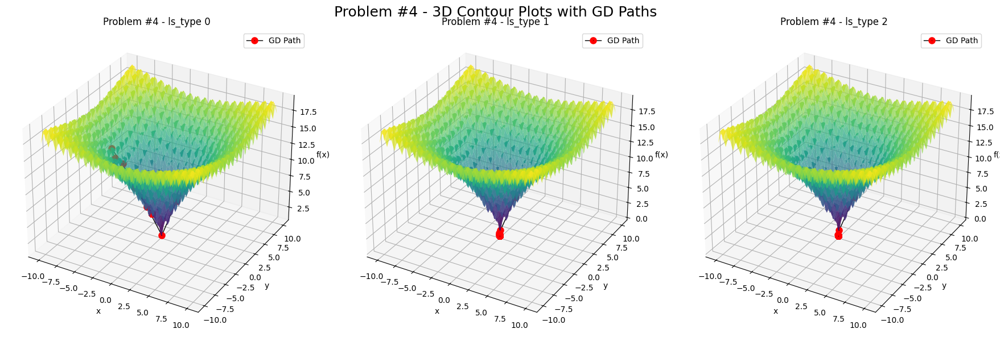

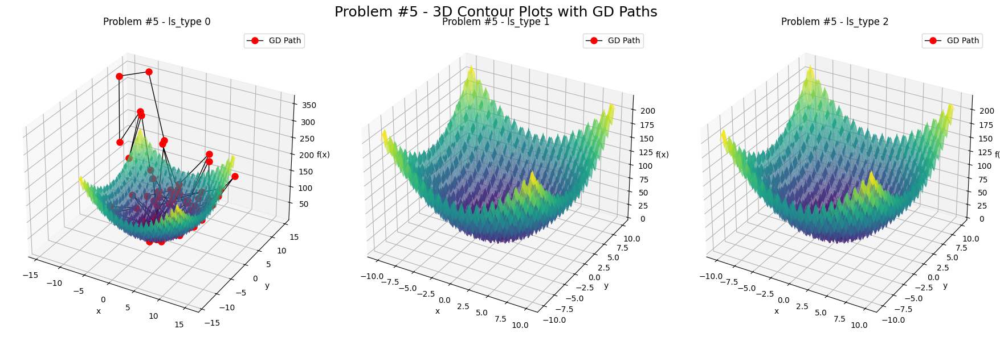

In [ ]:

def fun1(x):
    return x[0]**2 + 2*x[1]**2

def grad_fun1(x):
    return np.array([2*x[0], 4*x[1]])

x_initial1 = np.array([4, 5])
ls_params1 = {
    "alpha_st": 0.58,
    "rho": 0.5,
    "c": 0.35,
    "maxit": 100,
    "grad_fun": grad_fun1
}
params_gd1 = {
    "tol": 1e-5,
    "maxit": 70,
    "ls_params": ls_params1,
    "grad_fun": grad_fun1
}

def fun2(x):
    return x[0]**2 + (1/10)*x[1]**2

def grad_fun2(x):
    return np.array([2*x[0], (1/5)*x[1]])

x_initial2 = np.array([-5, 7])
ls_params2 = {
    "alpha_st": 0.73,
    "rho": 0.5,
    "c": 1e-4,
    "maxit": 30,
    "grad_fun": grad_fun2
}
params_gd2 = {
    "tol": 1e-5,
    "maxit": 20,
    "ls_params": ls_params2,
    "grad_fun": grad_fun2
}

def fun3(x):
    return (x[0]**2 + x[1] - 11)**2 + (x[0] + x[1]**2 - 7)**2

def grad_fun3(x):
    dfdx = 4*x[0]*(x[0]**2 + x[1] - 11) + 2*(x[0] + x[1]**2 - 7)
    dfdy = 2*(x[0]**2 + x[1] - 11) + 4*x[1]*(x[0] + x[1]**2 - 7)
    return np.array([dfdx, dfdy])

x_initial3 = np.array([1, 9])
ls_params3 = {
    "alpha_st": 0.63,
    "rho": 0.35,
    "c": 0.35,
    "maxit": 100,
    "grad_fun": grad_fun3
}
params_gd3 = {
    "tol": 1e-5,
    "maxit": 100,
    "ls_params": ls_params3,
    "grad_fun": grad_fun3
}

def fun4(x):
    term1 = -20 * np.exp(-0.2 * np.sqrt(0.5*(x[0]**2 + x[1]**2)))
    term2 = -np.exp(0.5*(np.cos(2*np.pi*x[0]) + np.cos(2*np.pi*x[1])))
    return term1 + term2 + np.e + 20

def grad_fun4(x):
    A = np.sqrt((x[0]**2 + x[1]**2)/2)
    dT1_dx = (2*x[0]/A) * np.exp(-0.2*A)
    dT1_dy = (2*x[1]/A) * np.exp(-0.2*A)
    common_factor = np.exp(0.5*(np.cos(2*np.pi*x[0]) + np.cos(2*np.pi*x[1])))
    dT2_dx = np.pi*np.sin(2*np.pi*x[0]) * common_factor
    dT2_dy = np.pi*np.sin(2*np.pi*x[1]) * common_factor
    return np.array([dT1_dx + dT2_dx, dT1_dy + dT2_dy])

x_initial4 = np.array([1, 2])
ls_params4 = {
    "alpha_st": 2.1,
    "rho": 0.8,
    "c": 0.4,
    "maxit": 100,
    "grad_fun": grad_fun4
}
params_gd4 = {
    "tol": 1e-5,
    "maxit": 100,
    "ls_params": ls_params4,
    "grad_fun": grad_fun4
}

def fun5(x):
    A = 10
    return (2*A +
            (x[0]**2 - A*np.cos(2*np.pi*x[0])) +
            (x[1]**2 - A*np.cos(2*np.pi*x[1])))

def grad_fun5(x):
    grad_x = 2*x[0] + 2*A*np.pi*np.sin(2*np.pi*x[0])
    grad_y = 2*x[1] + 2*A*np.pi*np.sin(2*np.pi*x[1])
    return np.array([grad_x, grad_y])
A = 10

x_initial5 = np.array([2, 5])
ls_params5 = {
    "alpha_st": 5.5,
    "rho": 0.5,
    "c": 1e-6,
    "maxit": 100,
    "grad_fun": grad_fun5
}
params_gd5 = {
    "tol": 1e-5,
    "maxit": 100,
    "ls_params": ls_params5,
    "grad_fun": grad_fun5
}

def create_3d_grid_plot(problem_name, fun, x_initial, params_gd, ls_types, plot_range):
    x_min, x_max = plot_range
    x_grid = np.linspace(x_min, x_max, 100)
    y_grid = np.linspace(x_min, x_max, 100)
    X, Y = np.meshgrid(x_grid, y_grid)
    Z = fun([X, Y])
    
    fig = plt.figure(figsize=(18, 6))
    
    for i, ls in enumerate(ls_types):
        params_gd["ls_params"]["ls_type"] = ls
        
        final_x, iter_count, final_f, final_grad, norm_grad, iter_list, norms_list, f_values_list, xs, ys = grad_descent(fun, x_initial, params_gd)
        
        ax = fig.add_subplot(1, 3, i+1, projection='3d')
        
        ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.7)
        
        plot_gd_path_3d(fun, xs, ys, ax)
        
        ax.set_title(f"{problem_name} - ls_type {ls}")
        ax.set_xlabel("x")
        ax.set_ylabel("y")
        ax.set_zlabel("f(x)")
    
    plt.suptitle(f"{problem_name} - 3D Contour Plots with GD Paths", fontsize=18)
    plt.tight_layout()
    plt.show()

ls_types = [0, 1, 2]

create_3d_grid_plot("Problem #1", fun1, x_initial1, params_gd1, ls_types, (-10, 10))
create_3d_grid_plot("Problem #2", fun2, x_initial2, params_gd2, ls_types, (-10, 10))
create_3d_grid_plot("Problem #3", fun3, x_initial3, params_gd3, ls_types, (-10, 10))
create_3d_grid_plot("Problem #4", fun4, x_initial4, params_gd4, ls_types, (-10, 10))
create_3d_grid_plot("Problem #5", fun5, x_initial5, params_gd5, ls_types, (-10, 10))

## Section C: Reflections

For each problem, provide your reflections on the following aspects:

#### **Problem X: Reflections**

- **Behaviour:** (Max 60 words, brief one line answer to each question should suffice).
   - Which line search method required the least number of iterations?
   - Discuss why that method might be faster given the function landscape.
   - Which method produced the most stable and smooth descent trajectory?

  #### **Write Your Reflections Below:**

- **Problem 1:**
  -  ls_type 2 required the fewest iterations (20), compared to ls_type 1 (24) and ls_type 0 (70)
  -  Backtracking (ls_type 2) adapts the step size using the Armijo condition, which in a smooth quadratic landscape allows larger effective steps and faster progress.
  - Although ls_type 1 reached a lower new_value, ls_type 2’s adaptive behavior produced a smooth, consistent descent trajectory.

- **Problem 2:**
  -  All three methods converged in 20 iterations.
  -  the adaptive methods (ls_type 1 and 2) quickly refined the step size to reduce the function value to 0.0376, while ls_type 0 was less effective.
  - ls_type 1 and ls_type 2 produced nearly identical final values and smooth descent paths, indicating stable convergence; constant step size lagged behind in reducing the objective.

- **Problem 3:**
  -  ls_type 1 was fastest with 26 iterations
  -  exact line search quickly identifies a step that drops the function value significantly in a multimodal landscape, avoiding the oscillations of a constant step.
  - ls_type 1 produced a final new_value in the 1e-13 range, showing a very stable and smooth descent, whereas ls_type 0 exhibited slow and unstable convergence.

- **Problem 4:**
  -  All methods reached 100 iterations
  -  both ls_type 1 and ls_type 2 adapt the step size to the local curvature, outperforming the constant step size.
  -  descent trajectories for ls_type 1 and 2 were extremely smooth and stable , while ls_type 0 converged to a not optimal value.

- **Problem 5:**
  -  ls_type 1 and ls_type 2 converged in only 19 iterations, while ls_type 0 required 100 iterations
  -  The adaptive methods quickly navigate the many local minima present in the Rastrigin function
  -  ls_type 1 and 2 produced very low final function values (≈5.86e-14) and stable descent paths, demonstrating that adaptive step-sizing is essential in such rugged landscapes.

---

# ADAM and ADADELTA



## Section A: Report your Results

| **Problem**    | **Optimizer** | **Baseline f(x)** | **Baseline Iterations** | **Your f(x)** | **Your Iterations** |
|---------------|--------------|-------------------|-------------------------|---------------|--------------------|
| Rosenbrock    | Adam         | 0.5          | 10000                   |      0.354         |     10000               |
| Rosenbrock    | AdaDelta     | 0.5          | 10000                   |       0.484        |      10000              |
| Himmelblau    | Adam         | 50           | 100                     |         41.64      |          100          |
| Himmelblau    | AdaDelta     | 4400           | 100                     |       3973.36        |          100          |
| Rastrigin     | Adam         | 50            | 110                     |    40.793           |           110         |
| Rastrigin     | AdaDelta     | 50            | 18                      |       40.793        |     18               |


### Section B: Visualize Results

For each problem, you are required to create a **grid of side-by-side** showing the  gradient descent paths for each optimizer.  
- **Tip:** Use subplots (e.g., `plt.subplot(1, 3, i+1)`) to display the three views together.
- Include a title for each subplot indicating the corresponding optimizer type.


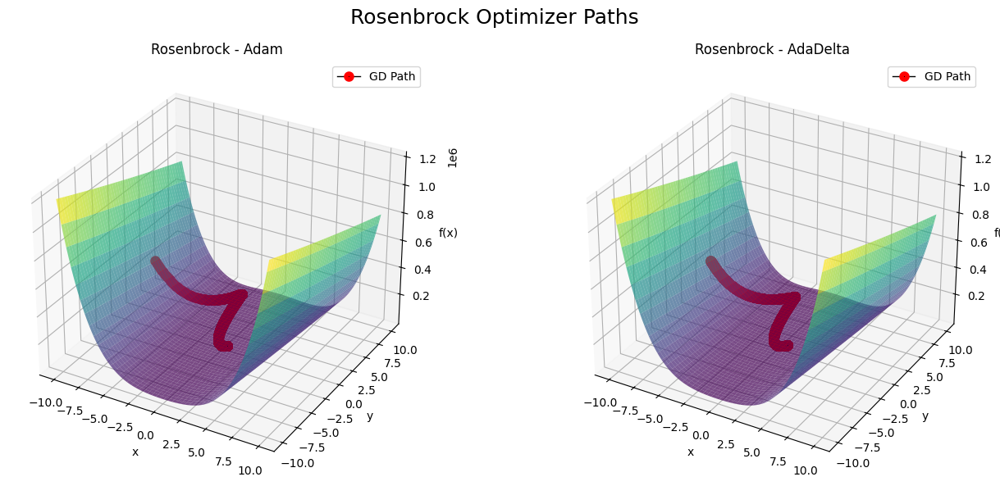

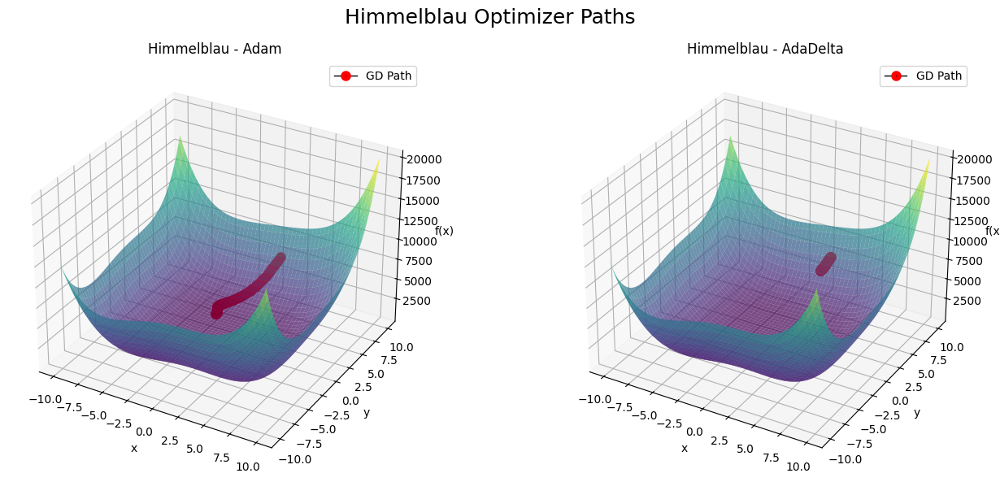

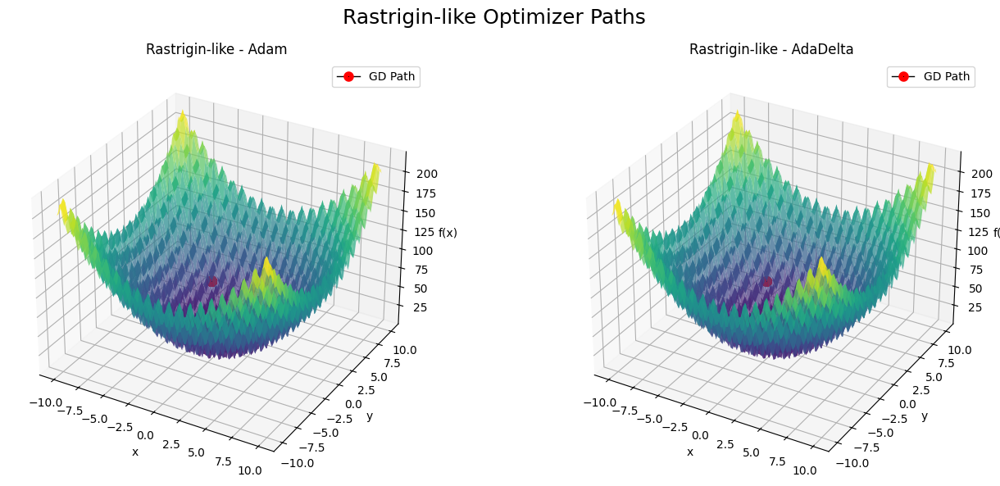

In [36]:
def rosenbrock_function(x, a=1, b=100):
    x_val, y = x[0], x[1]
    return (a - x_val)**2 + b*(y - x_val**2)**2

def rosenbrock_grad(x, a=1, b=100):
    x_val, y = x[0], x[1]
    dfdx = -2*(a - x_val) - 4*b*x_val*(y - x_val**2)
    dfdy = 2*b*(y - x_val**2)
    return np.array([dfdx, dfdy])

x_initial1 = np.array([-8.0, 2.0])
adam_lr1 = 0.1
adam_maxit1 = 10000
adadelta_rho1 = 0.95
adadelta_maxit1 = 10000

def himmelblau_function(x):
    return (x[0]**2 + x[1] - 11)**2 + (x[0] + x[1]**2 - 7)**2

def himmelblau_grad(x):
    dfdx = 4*x[0]*(x[0]**2 + x[1] - 11) + 2*(x[0] + x[1]**2 - 7)
    dfdy = 2*(x[0]**2 + x[1] - 11) + 4*x[1]*(x[0] + x[1]**2 - 7)
    return np.array([dfdx, dfdy])

x_initial2 = np.array([1.0, 9.0])
adam_lr2 = 0.1
adam_maxit2 = 100
adadelta_rho2 = 0.98
adadelta_maxit2 = 100

def rastrigin_fun(x):
    A = 10
    x_val, y_val = x[0], x[1]
    return (2 * A +
            (x_val**2 - A * np.cos(2 * np.pi * x_val)) +
            (y_val**2 - A * np.cos(2 * np.pi * y_val)))

def rastrigin_grad_fun(x):
    x_val, y_val = x[0], x[1]
    grad_x = 2 * x_val + 20 * np.pi * np.sin(2 * np.pi * x_val)
    grad_y = 2 * y_val + 20 * np.pi * np.sin(2 * np.pi * y_val)
    return np.array([grad_x, grad_y])

x_initial3 = np.array([-4.0, 5.0])
adam_lr3 = 0.1
adam_maxit3 = 110
adadelta_rho3 = 0.95
adadelta_maxit3 = 18

def create_optimizer_subplot(problem_name, fun, grad_fun, x_initial, adam_params, adadelta_params, plot_range):
    x_min, x_max = plot_range
    x_grid = np.linspace(x_min, x_max, 100)
    y_grid = np.linspace(x_min, x_max, 100)
    X, Y = np.meshgrid(x_grid, y_grid)
    Z = fun([X, Y])
    
    x_final_adam, f_final_adam, grad_norm_adam, iters_adam, path_adam = adam_optimizer(
        fun, grad_fun, x_initial, lr=adam_params['lr'], tol=adam_params['tol'], maxit=adam_params['maxit']
    )
    xs_adam = [pt[0] for pt in path_adam]
    ys_adam = [pt[1] for pt in path_adam]
    
    x_final_adadelta, f_final_adadelta, grad_norm_adadelta, iters_adadelta, path_adadelta = adadelta_optimizer(
        fun, grad_fun, x_initial, rho=adadelta_params['rho'], tol=adadelta_params['tol'], maxit=adadelta_params['maxit']
    )
    xs_ada = [pt[0] for pt in path_adadelta]
    ys_ada = [pt[1] for pt in path_adadelta]
    
    fig = plt.figure(figsize=(14, 6))
    
    ax1 = fig.add_subplot(1, 2, 1, projection='3d')
    ax1.plot_surface(X, Y, Z, cmap='viridis', alpha=0.7)
    plot_gd_path_3d(fun, xs_adam, ys_adam, ax1)
    ax1.set_title(f"{problem_name} - Adam")
    ax1.set_xlabel("x")
    ax1.set_ylabel("y")
    ax1.set_zlabel("f(x)")
    
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    ax2.plot_surface(X, Y, Z, cmap='viridis', alpha=0.7)
    plot_gd_path_3d(fun, xs_ada, ys_ada, ax2)
    ax2.set_title(f"{problem_name} - AdaDelta")
    ax2.set_xlabel("x")
    ax2.set_ylabel("y")
    ax2.set_zlabel("f(x)")
    
    plt.suptitle(f"{problem_name} Optimizer Paths", fontsize=18)
    plt.tight_layout()
    plt.show()

adam_params1 = {"lr": adam_lr1, "tol": 1e-5, "maxit": adam_maxit1}
adadelta_params1 = {"rho": adadelta_rho1, "tol": 1e-5, "maxit": adadelta_maxit1}

adam_params2 = {"lr": adam_lr2, "tol": 1e-5, "maxit": adam_maxit2}
adadelta_params2 = {"rho": adadelta_rho2, "tol": 1e-5, "maxit": adadelta_maxit2}

adam_params3 = {"lr": adam_lr3, "tol": 1e-5, "maxit": adam_maxit3}
adadelta_params3 = {"rho": adadelta_rho3, "tol": 1e-5, "maxit": adadelta_maxit3}

create_optimizer_subplot("Rosenbrock", rosenbrock_function, rosenbrock_grad, x_initial1, adam_params1, adadelta_params1, (-10, 10))
create_optimizer_subplot("Himmelblau", himmelblau_function, himmelblau_grad, x_initial2, adam_params2, adadelta_params2, (-10, 10))
create_optimizer_subplot("Rastrigin-like", rastrigin_fun, rastrigin_grad_fun, x_initial3, adam_params3, adadelta_params3, (-10, 10))


# Thats it you are done with this part! ╰(*°▽°*)╯